# **4. Feature Engineering Notebook**

---

## Objectives

* Perform feature engineering tasks, building on the data manipulation completed as part of the data cleaning

## Inputs

* Using /workspace/milestone-project-housing-issues/outputs/datasets/cleaned/HousePricesClean.csv

## Outputs

* The outputs of the Feature Engineering notebook are two new saved files:
*Train Set:* ('outputs/datasets/cleaned/TrainSetTransformed.csv'), and
*Test Set:* ('outputs/datasets/cleaned/TestSetTransformed.csv')

## Additional Comments

* As part of the data cleaning process missing data, data with excessive zero-values, and categorical data have all been transformed
* New binary variables have been created to account for data with excessive zeroes
* Correlation and predictive power scores have been calculated, and the feature engineering notebook will build on the results of these


---

## Changing working directory

In [21]:
import os

# Get the current directory
current_dir = os.getcwd()
print("Current Directory:", current_dir)

# Change the directory to the new path
os.chdir('/workspace/milestone-project-housing-issues')

# Get the updated current directory
current_dir = os.getcwd()
print("New Current Directory:", current_dir)

Current Directory: /workspace/milestone-project-housing-issues
New Current Directory: /workspace/milestone-project-housing-issues


In [22]:
# Loading dataset HousePricesClean from /workspace/milestone-project-housing-issues/outputs/datasets/cleaned/HousePricesClean.csv
import pandas as pd
df_houseprices_FE = pd.read_csv(f"/workspace/milestone-project-housing-issues/outputs/datasets/cleaned/HousePricesClean.csv")
df_houseprices_FE.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,856,854,3,1,706,6,150,548,2,2003,...,8450,65,196,61,5,7,856,2003,2003,208500
1,1262,858,3,4,978,5,284,460,2,1976,...,9600,80,436,96,8,6,1262,1976,1976,181500
2,920,866,3,2,486,6,434,608,2,2001,...,11250,68,162,42,5,7,920,2001,2002,223500
3,961,1142,3,1,216,5,540,642,1,1998,...,9550,60,106,35,5,7,756,1915,1970,140000
4,1145,807,4,3,655,6,490,836,2,2000,...,14260,84,350,84,5,8,1145,2000,2000,250000


In [23]:
# Confirming features and that no missing data in df_houseprices_FE
df_houseprices_FE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   1stFlrSF      1460 non-null   int64
 1   2ndFlrSF      1460 non-null   int64
 2   BedroomAbvGr  1460 non-null   int64
 3   BsmtExposure  1460 non-null   int64
 4   BsmtFinSF1    1460 non-null   int64
 5   BsmtFinType1  1460 non-null   int64
 6   BsmtUnfSF     1460 non-null   int64
 7   GarageArea    1460 non-null   int64
 8   GarageFinish  1460 non-null   int64
 9   GarageYrBlt   1460 non-null   int64
 10  GrLivArea     1460 non-null   int64
 11  KitchenQual   1460 non-null   int64
 12  LotArea       1460 non-null   int64
 13  LotFrontage   1460 non-null   int64
 14  MasVnrArea    1460 non-null   int64
 15  OpenPorchSF   1460 non-null   int64
 16  OverallCond   1460 non-null   int64
 17  OverallQual   1460 non-null   int64
 18  TotalBsmtSF   1460 non-null   int64
 19  YearBuilt     1460 non-null

In [24]:
# Adding OverallCond and OverallQual to the list of object variables
df_houseprices_FE[['BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual',]] = df_houseprices_FE[[
            'BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual']].astype(object)

df_houseprices_FE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   1stFlrSF      1460 non-null   int64 
 1   2ndFlrSF      1460 non-null   int64 
 2   BedroomAbvGr  1460 non-null   int64 
 3   BsmtExposure  1460 non-null   object
 4   BsmtFinSF1    1460 non-null   int64 
 5   BsmtFinType1  1460 non-null   object
 6   BsmtUnfSF     1460 non-null   int64 
 7   GarageArea    1460 non-null   int64 
 8   GarageFinish  1460 non-null   object
 9   GarageYrBlt   1460 non-null   int64 
 10  GrLivArea     1460 non-null   int64 
 11  KitchenQual   1460 non-null   object
 12  LotArea       1460 non-null   int64 
 13  LotFrontage   1460 non-null   int64 
 14  MasVnrArea    1460 non-null   int64 
 15  OpenPorchSF   1460 non-null   int64 
 16  OverallCond   1460 non-null   object
 17  OverallQual   1460 non-null   object
 18  TotalBsmtSF   1460 non-null   int64 
 19  YearBu

In [25]:
# Save dataset for use in the transformation process, to make changes in format permanent
df_houseprices_FE.to_csv("outputs/datasets/cleaned/HousePricesFE.csv", index=False)

In [26]:
# Loading dataset for use in transformations process
df_houseprices_FE = pd.read_csv(
    f"/workspace/milestone-project-housing-issues/outputs/datasets/cleaned/HousePricesFE.csv", 
    dtype={'OverallCond': 'object', 'OverallQual': 'object'}
)

print(df_houseprices_FE.dtypes)

1stFlrSF         int64
2ndFlrSF         int64
BedroomAbvGr     int64
BsmtExposure     int64
BsmtFinSF1       int64
BsmtFinType1     int64
BsmtUnfSF        int64
GarageArea       int64
GarageFinish     int64
GarageYrBlt      int64
GrLivArea        int64
KitchenQual      int64
LotArea          int64
LotFrontage      int64
MasVnrArea       int64
OpenPorchSF      int64
OverallCond     object
OverallQual     object
TotalBsmtSF      int64
YearBuilt        int64
YearRemodAdd     int64
SalePrice        int64
dtype: object


In [27]:
print("Unique values in OverallCond:", df_houseprices_FE['OverallCond'].dtypes)
print("Unique values in OverallQual:", df_houseprices_FE['OverallQual'].dtypes)

Unique values in OverallCond: object
Unique values in OverallQual: object


In [28]:
# Revisiting data for feature engineering purposes
from ydata_profiling import ProfileReport

pandas_report = ProfileReport(df_houseprices_FE, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---

## Splitting data into Test and Train datasets

In [29]:
from sklearn.model_selection import train_test_split
TrainSet, TestSet, _, __ = train_test_split(
                    df_houseprices_FE,
                    df_houseprices_FE['SalePrice'],
                    test_size=0.2,
                    random_state=0)

print(f"TrainSet shape: {TrainSet.shape} \nTestSet shape: {TestSet.shape}")

TrainSet shape: (1168, 22) 
TestSet shape: (292, 22)


In [30]:
# Saving train and test datasets

## Train Set
TrainSet.to_csv("outputs/datasets/cleaned/TrainSet.csv", index=False)
## Test Set
TestSet.to_csv("outputs/datasets/cleaned/TestSet.csv", index=False)

---

## Feature Engineering using transformers

#### Converting the categorical features back into object type to enable feature engineering functions

Includes variables that were objects in the original dataset: 
* BsmtExposure
* BsmtFinType1
* GarageFinish
* KitchenQual

Also includes categorical features that were in numerical format in the original dataset:
* OverallCond
* OverallQual

In [31]:
# Converting categorical variables back into object form for feature engineering
TrainSet[['BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual',]] = TrainSet[[
            'BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual']].astype(object)

TrainSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 618 to 684
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   1stFlrSF      1168 non-null   int64 
 1   2ndFlrSF      1168 non-null   int64 
 2   BedroomAbvGr  1168 non-null   int64 
 3   BsmtExposure  1168 non-null   object
 4   BsmtFinSF1    1168 non-null   int64 
 5   BsmtFinType1  1168 non-null   object
 6   BsmtUnfSF     1168 non-null   int64 
 7   GarageArea    1168 non-null   int64 
 8   GarageFinish  1168 non-null   object
 9   GarageYrBlt   1168 non-null   int64 
 10  GrLivArea     1168 non-null   int64 
 11  KitchenQual   1168 non-null   object
 12  LotArea       1168 non-null   int64 
 13  LotFrontage   1168 non-null   int64 
 14  MasVnrArea    1168 non-null   int64 
 15  OpenPorchSF   1168 non-null   int64 
 16  OverallCond   1168 non-null   object
 17  OverallQual   1168 non-null   object
 18  TotalBsmtSF   1168 non-null   int64 
 19  YearB

In [32]:
# Converting categorical variables back into object form for feature engineering
TestSet[['BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual',]] = TestSet[[
            'BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual']].astype(object)

TestSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292 entries, 529 to 61
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   1stFlrSF      292 non-null    int64 
 1   2ndFlrSF      292 non-null    int64 
 2   BedroomAbvGr  292 non-null    int64 
 3   BsmtExposure  292 non-null    object
 4   BsmtFinSF1    292 non-null    int64 
 5   BsmtFinType1  292 non-null    object
 6   BsmtUnfSF     292 non-null    int64 
 7   GarageArea    292 non-null    int64 
 8   GarageFinish  292 non-null    object
 9   GarageYrBlt   292 non-null    int64 
 10  GrLivArea     292 non-null    int64 
 11  KitchenQual   292 non-null    object
 12  LotArea       292 non-null    int64 
 13  LotFrontage   292 non-null    int64 
 14  MasVnrArea    292 non-null    int64 
 15  OpenPorchSF   292 non-null    int64 
 16  OverallCond   292 non-null    object
 17  OverallQual   292 non-null    object
 18  TotalBsmtSF   292 non-null    int64 
 19  YearBui

### Creating custom function for feature engineering functions
* Examining categorical values
* Examining numerical data
* Applying required transformers

*The code has been provided by Code Institute*

In [33]:
# Custom engineering function -Code from Code Institute
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
sns.set(style="whitegrid")
warnings.filterwarnings('ignore')

df = TrainSet

def FeatureEngineeringAnalysis(df, analysis_type=None):
  """
  - used for quick feature engineering on numerical and categorical variables
  to decide which transformation can better transform the distribution shape
  - Once transformed, use a reporting tool, like ydata-profiling, to evaluate distributions
  """
  check_missing_values(df)
  allowed_types = ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
  check_user_entry_on_analysis_type(analysis_type, allowed_types)
  list_column_transformers = define_list_column_transformers(analysis_type)

  # Loop in each variable and engineer the data according to the analysis type
  df_feat_eng = pd.DataFrame([])
  for column in df.columns:
    # create additional columns (column_method) to apply the methods
    df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
    for method in list_column_transformers:
      df_feat_eng[f"{column}_{method}"] = df[column]

    # Apply transformers in respective column_transformers
    df_feat_eng, list_applied_transformers = apply_transformers(
      analysis_type, df_feat_eng, column)

    # For each variable, assess how the transformations perform
    transformer_evaluation(
      column, list_applied_transformers, analysis_type, df_feat_eng)

  return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
  """ Check analysis type """
  if analysis_type is None:
    raise SystemExit(
      f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
  if analysis_type not in allowed_types:
    raise SystemExit(
      f"analysis_type argument should be one of these options: {allowed_types}")


def check_missing_values(df):
  if df.isna().sum().sum() != 0:
    raise SystemExit(
      f"There is a missing value in your dataset. Please handle that before getting into feature engineering.")


def define_list_column_transformers(analysis_type):
  """ Set suffix columns according to analysis_type"""
  if analysis_type == 'numerical':
    list_column_transformers = [
      "log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]

  elif analysis_type == 'ordinal_encoder':
    list_column_transformers = ["ordinal_encoder"]

  elif analysis_type == 'outlier_winsorizer':
    list_column_transformers = ['iqr']

  return list_column_transformers


def apply_transformers(analysis_type, df_feat_eng, column):
  for col in df_feat_eng.select_dtypes(include='category').columns:
    df_feat_eng[col] = df_feat_eng[col].astype('object')

  if analysis_type == 'numerical':
    df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(
      df_feat_eng, column)

  elif analysis_type == 'outlier_winsorizer':
    df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(
      df_feat_eng, column)

  elif analysis_type == 'ordinal_encoder':
    df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(
      df_feat_eng, column)

  return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
  # For each variable, assess how the transformations perform
  print(f"* Variable Analyzed: {column}")
  print(f"* Applied transformation: {list_applied_transformers} \n")
  for col in [column] + list_applied_transformers:

    if analysis_type != 'ordinal_encoder':
      DiagnosticPlots_Numerical(df_feat_eng, col)

    else:
      if col == column:
        DiagnosticPlots_Categories(df_feat_eng, col)
      else:
        DiagnosticPlots_Numerical(df_feat_eng, col)

    print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
  plt.figure(figsize=(4, 3))
  sns.countplot(data=df_feat_eng, x=col, palette=[
         '#432371'])
  plt.xticks(rotation=90)
  plt.suptitle(f"{col}", fontsize=30, y=1.05)
  plt.show()
  print("\n")


def DiagnosticPlots_Numerical(df, variable):
  fig, axes = plt.subplots(1, 3, figsize=(12, 4))
  sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0])
  stats.probplot(df[variable], dist="norm", plot=axes[1])
  sns.boxplot(x=df[variable], ax=axes[2])

  axes[0].set_title('Histogram')
  axes[1].set_title('QQ Plot')
  axes[2].set_title('Boxplot')
  fig.suptitle(f"{variable}", fontsize=30, y=1.05)
  plt.tight_layout()
  plt.show()


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
  list_methods_worked = []
  try:
    encoder = OrdinalEncoder(encoding_method='arbitrary', variables=[
                 f"{column}_ordinal_encoder"])
    df_feat_eng = encoder.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_ordinal_encoder")

  except Exception:
    df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)

  return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng, columns):
    """
    Applies Winsorization to multiple columns using the IQR method.

    Parameters:
    - df_feat_eng (pd.DataFrame): DataFrame containing the features.
    - columns (list): List of column names to Winsorize.

    Returns:
    - pd.DataFrame: DataFrame with Winsorized columns.
    - list: List of methods that worked.
    """
    list_methods_worked = []

    for column in columns:
        try:
            # Initialize Winsorizer for the current column
            disc = Winsorizer(
                capping_method='iqr',
                tail='both',
                fold=1.5,
                variables=[column]
            )
            # Apply Winsorization
            df_feat_eng = disc.fit_transform(df_feat_eng)
            list_methods_worked.append(f"{column}_iqr")
        except Exception as e:
            # Print error message but continue with other columns
            print(f"Failed to Winsorize {column}: {e}")
    
    # Ensure both the DataFrame and list of applied methods are returned
    return df_feat_eng, list_methods_worked


def FeatEngineering_Numerical(df_feat_eng, column):
  list_methods_worked = []

  # LogTransformer base e
  try:
    lt = vt.LogTransformer(variables=[f"{column}_log_e"])
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_e")
  except Exception:
    df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

  # LogTransformer base 10
  try:
    lt = vt.LogTransformer(variables=[f"{column}_log_10"], base='10')
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_10")
  except Exception:
    df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

  # ReciprocalTransformer
  try:
    rt = vt.ReciprocalTransformer(variables=[f"{column}_reciprocal"])
    df_feat_eng = rt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_reciprocal")
  except Exception:
    df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

  # PowerTransformer
  try:
    pt = vt.PowerTransformer(variables=[f"{column}_power"])
    df_feat_eng = pt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_power")
  except Exception:
    df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

  # BoxCoxTransformer
  try:
    bct = vt.BoxCoxTransformer(variables=[f"{column}_box_cox"])
    df_feat_eng = bct.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_box_cox")
  except Exception:
    df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)

  # YeoJohnsonTransformer
  try:
    yjt = vt.YeoJohnsonTransformer(variables=[f"{column}_yeo_johnson"])
    df_feat_eng = yjt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_yeo_johnson")
  except Exception:
    df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)

  return df_feat_eng, list_methods_worked


---

### Categorical encoding and transformations

In [34]:
TrainSet[['BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual',]] = TrainSet[[
            'BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual']].astype(object)

TrainSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 618 to 684
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   1stFlrSF      1168 non-null   int64 
 1   2ndFlrSF      1168 non-null   int64 
 2   BedroomAbvGr  1168 non-null   int64 
 3   BsmtExposure  1168 non-null   object
 4   BsmtFinSF1    1168 non-null   int64 
 5   BsmtFinType1  1168 non-null   object
 6   BsmtUnfSF     1168 non-null   int64 
 7   GarageArea    1168 non-null   int64 
 8   GarageFinish  1168 non-null   object
 9   GarageYrBlt   1168 non-null   int64 
 10  GrLivArea     1168 non-null   int64 
 11  KitchenQual   1168 non-null   object
 12  LotArea       1168 non-null   int64 
 13  LotFrontage   1168 non-null   int64 
 14  MasVnrArea    1168 non-null   int64 
 15  OpenPorchSF   1168 non-null   int64 
 16  OverallCond   1168 non-null   object
 17  OverallQual   1168 non-null   object
 18  TotalBsmtSF   1168 non-null   int64 
 19  YearB

* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_ordinal_encoder'] 



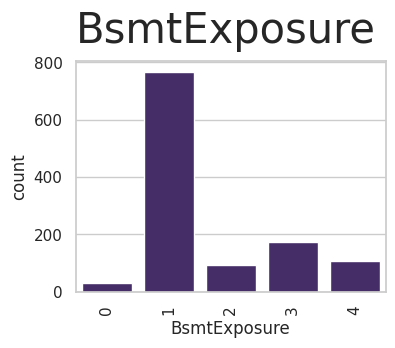

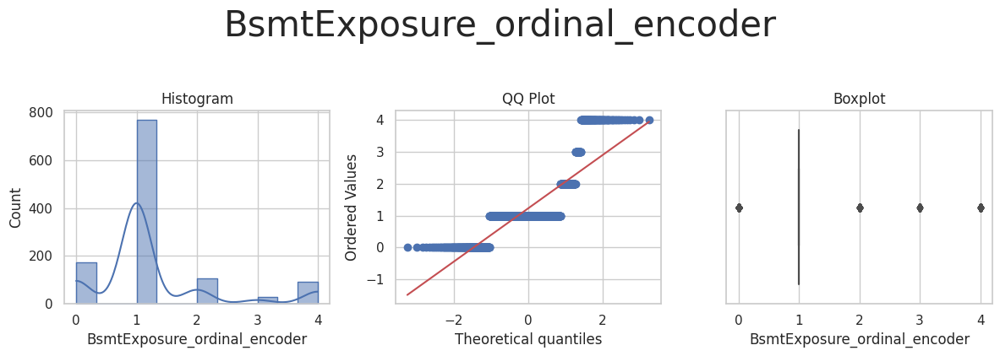



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_ordinal_encoder'] 



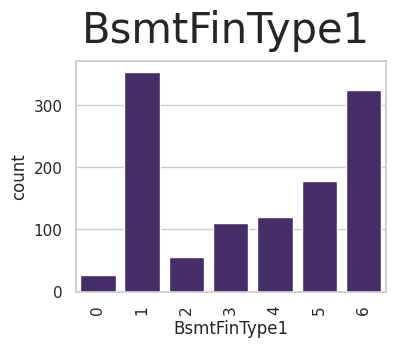

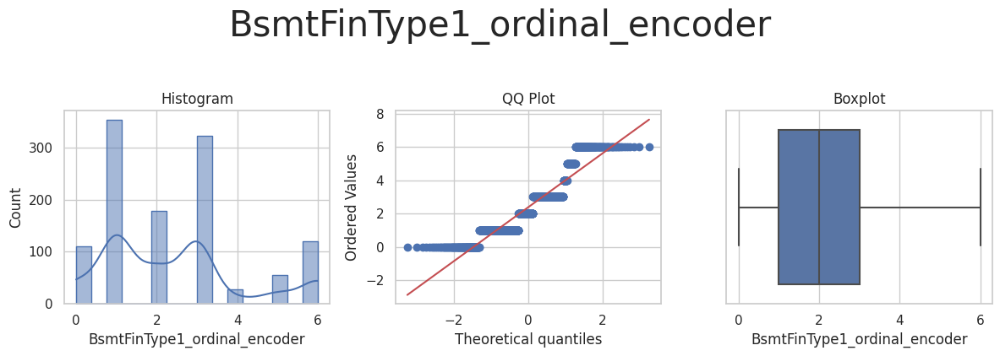



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_ordinal_encoder'] 



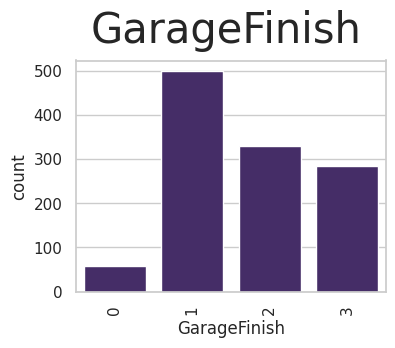

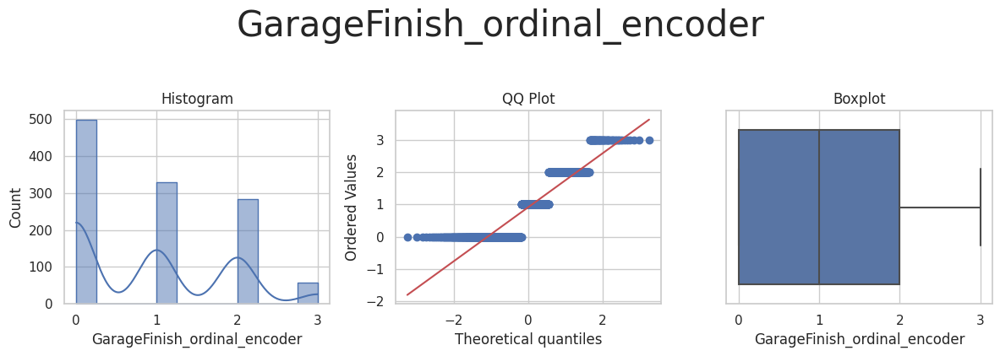



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_ordinal_encoder'] 



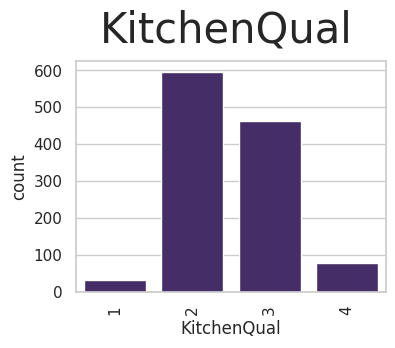

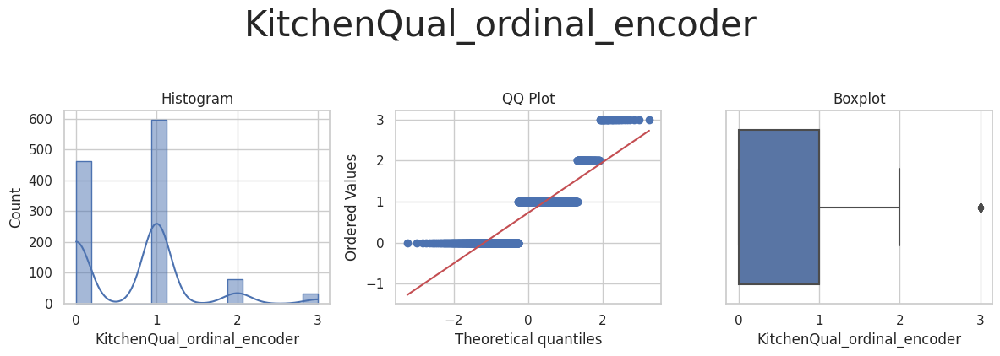



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_ordinal_encoder'] 



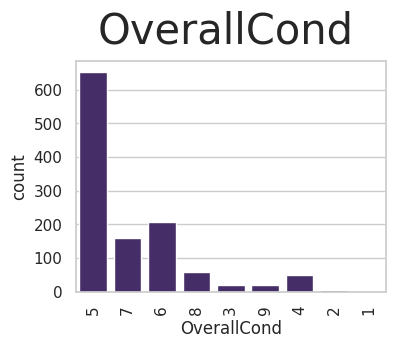

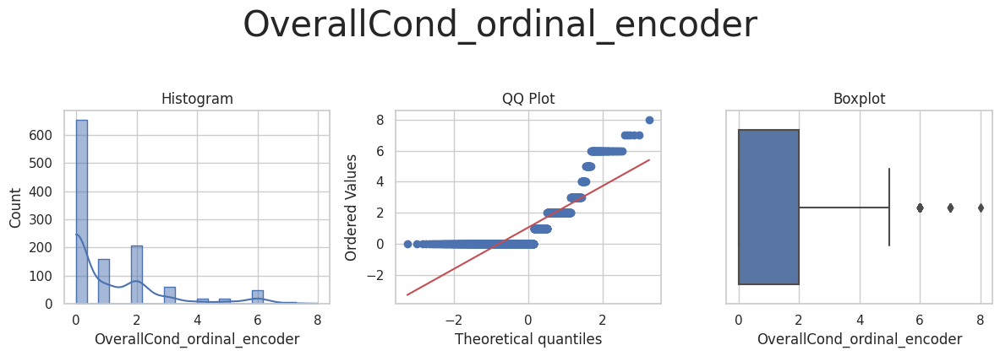



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_ordinal_encoder'] 



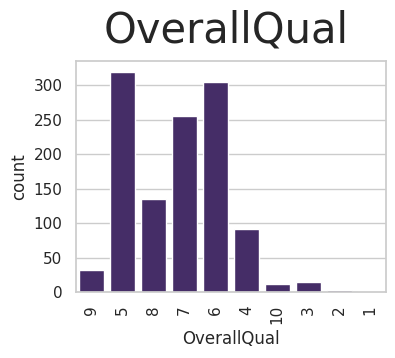

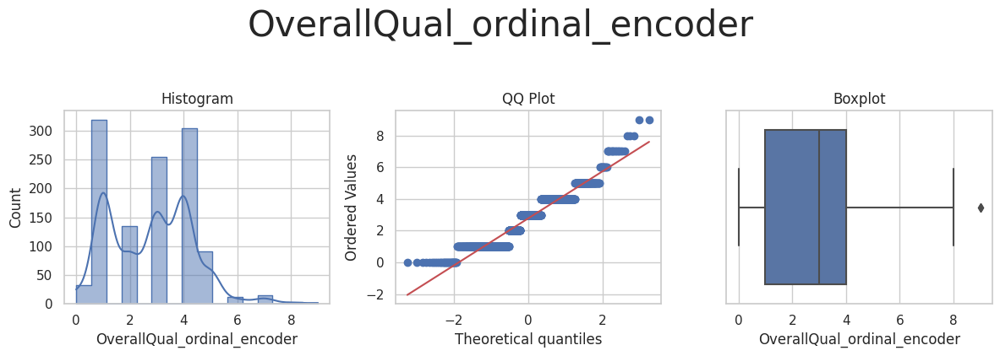

In [35]:
variables_engineering= ['BsmtExposure', 'BsmtFinType1', 'GarageFinish',
            'KitchenQual', 'OverallCond', 'OverallQual']
variables_engineering

# Creating a separate DataFrame, with recoded variables
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

# Creating engineered variabless by applying the transformations, assessing engineered variables distribution 
# and selecting the most suitable method for each variable.
df_engineering = FeatureEngineeringAnalysis(df_engineering, analysis_type='ordinal_encoder')


#### Applying the OrdinalEncoder transformations to the datasets

In [36]:
encoder = OrdinalEncoder(encoding_method='arbitrary', variables = variables_engineering)
TrainSet = encoder.fit_transform(TrainSet)
TestSet = encoder.transform(TestSet)

In [37]:
# Checking transformation of categorical features
TrainSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 618 to 684
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   1stFlrSF      1168 non-null   int64
 1   2ndFlrSF      1168 non-null   int64
 2   BedroomAbvGr  1168 non-null   int64
 3   BsmtExposure  1168 non-null   int64
 4   BsmtFinSF1    1168 non-null   int64
 5   BsmtFinType1  1168 non-null   int64
 6   BsmtUnfSF     1168 non-null   int64
 7   GarageArea    1168 non-null   int64
 8   GarageFinish  1168 non-null   int64
 9   GarageYrBlt   1168 non-null   int64
 10  GrLivArea     1168 non-null   int64
 11  KitchenQual   1168 non-null   int64
 12  LotArea       1168 non-null   int64
 13  LotFrontage   1168 non-null   int64
 14  MasVnrArea    1168 non-null   int64
 15  OpenPorchSF   1168 non-null   int64
 16  OverallCond   1168 non-null   int64
 17  OverallQual   1168 non-null   int64
 18  TotalBsmtSF   1168 non-null   int64
 19  YearBuilt     1168 non-nul

---

### Examining features with potential outliers, suggested by FeatureEngineeringAnalysis function above

In [38]:
# List of columns with outliers for Winsorization
vars_with_outliers = [
    '1stFlrSF', '2ndFlrSF', 'BsmtFinSF1',
    'BsmtUnfSF', 'GarageArea','GrLivArea',
    'LotArea', 'LotFrontage', 'MasVnrArea',
    'OpenPorchSF','TotalBsmtSF'
]

# Create a separate DataFrame with selected variables for TrainSet
df_train_outliers = TrainSet[vars_with_outliers].copy()

# Apply the Winsorizer function to TrainSet
df_train_winsorized, methods_applied_train = FeatEngineering_OutlierWinsorizer(df_train_outliers, columns=vars_with_outliers)

# Create a separate DataFrame with selected variables for TestSet
df_test_outliers = TestSet[vars_with_outliers].copy()

# Apply the Winsorizer function to TestSet
df_test_winsorized, methods_applied_test = FeatEngineering_OutlierWinsorizer(df_test_outliers, columns=vars_with_outliers)

# Display the first few rows to verify
print("TrainSet Winsorized:\n", df_train_winsorized.head(3))
print("\nTestSet Winsorized:\n", df_test_winsorized.head(3))
print("Methods Applied Train:", methods_applied_train, "Methods Applied Test:", methods_applied_test)


TrainSet Winsorized:
      1stFlrSF  2ndFlrSF  BsmtFinSF1  BsmtUnfSF  GarageArea  GrLivArea  \
618    1828.0     432.0        48.0     1680.0       774.0     1828.0   
870     894.0     764.0       673.0      894.0       308.0      894.0   
92      964.0     809.0       713.0      163.0       432.0      964.0   

     LotArea  LotFrontage  MasVnrArea  OpenPorchSF  TotalBsmtSF  
618  11694.0         90.0       452.0        108.0       1822.0  
870   6600.0         60.0       178.0         64.0        894.0  
92   13360.0         80.0       226.0         36.0        876.0  

TestSet Winsorized:
      1stFlrSF  2ndFlrSF  BsmtFinSF1  BsmtUnfSF  GarageArea  GrLivArea  \
529   2190.25     716.0      1219.0      816.0       484.0     2515.0   
491    958.00     620.0       403.0      238.0       240.0     1578.0   
459    979.00     224.0       185.0      524.0       352.0     1203.0   

       LotArea  LotFrontage  MasVnrArea  OpenPorchSF  TotalBsmtSF  
529  17695.875         65.0       604.

Comparing original data for variables with outliers with Winsorized data

In [39]:
# Original dataset summary stats
original_data_for_outliers = TrainSet[['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1',
    'BsmtUnfSF', 'GarageArea','GrLivArea',
    'LotArea', 'LotFrontage', 'MasVnrArea',
    'OpenPorchSF','TotalBsmtSF']].describe()
original_data_for_outliers

,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtUnfSF,GarageArea,GrLivArea,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,TotalBsmtSF
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,1160.958904,809.786815,664.595890,609.047089,497.524829,1518.882705,10589.672945,69.871575,254.206336,84.869863,1079.996575
std,373.315037,272.008147,380.861724,418.615358,183.789011,513.800708,10704.180793,23.522797,197.172153,69.219892,381.960612
min,334.000000,110.000000,16.000000,14.000000,160.000000,334.000000,1300.000000,21.000000,1.000000,8.000000,105.000000
25%,884.000000,640.000000,384.000000,280.000000,374.500000,1139.000000,7589.500000,60.000000,117.000000,39.000000,816.000000
50%,1092.000000,780.000000,623.500000,536.500000,484.000000,1471.500000,9512.500000,69.000000,207.000000,63.000000,1004.000000
75%,1389.250000,933.000000,902.000000,840.000000,579.000000,1788.500000,11601.500000,80.000000,325.000000,112.000000,1297.250000
max,3228.000000,1872.000000,2260.000000,2153.000000,1390.000000,4676.000000,215245.000000,313.000000,1600.000000,547.000000,3206.000000


In [40]:
# Exploring Winsorized data with ydata profiling report
from ydata_profiling import ProfileReport

pandas_report = ProfileReport(df_train_winsorized, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

As the winsorization of the dataset has created a negative skew by recoding the values to the highest included value, further transformations will be necessary.

In [41]:
# Writing the Winsorized variables into the dataframe
TrainSet[vars_with_outliers] = df_train_winsorized
TestSet[vars_with_outliers] = df_test_winsorized

---

## Numerical transformation

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



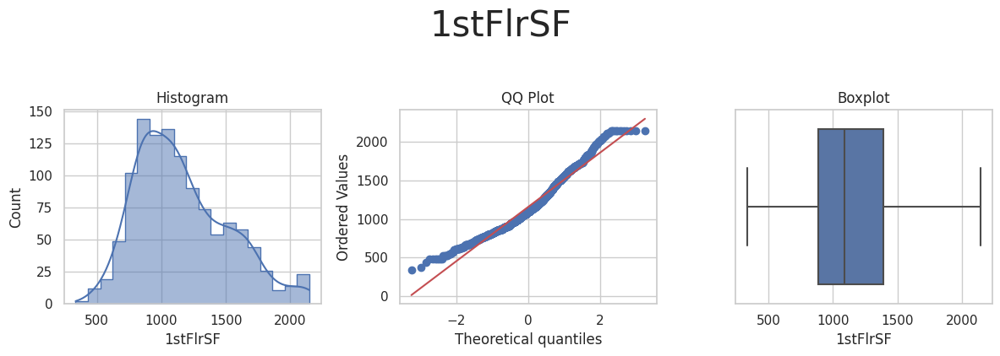

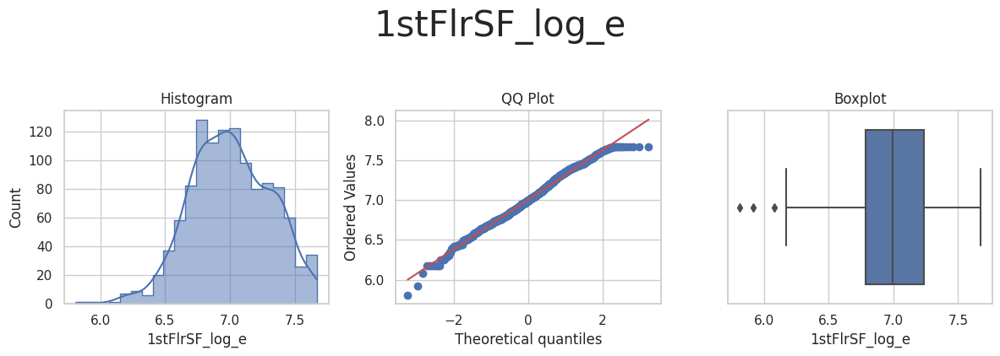

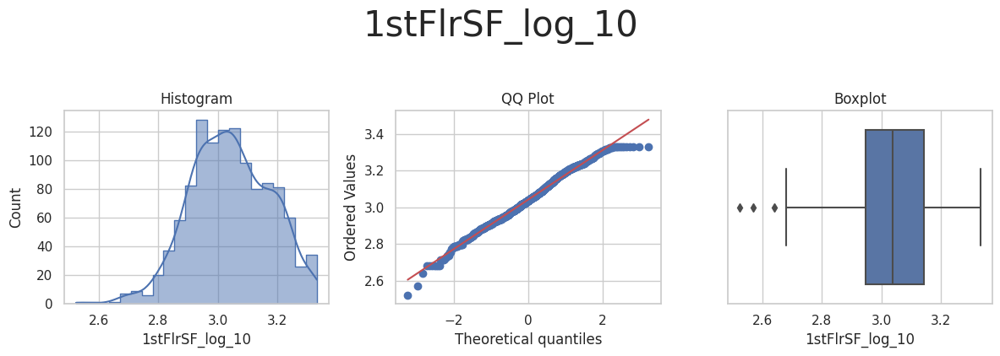

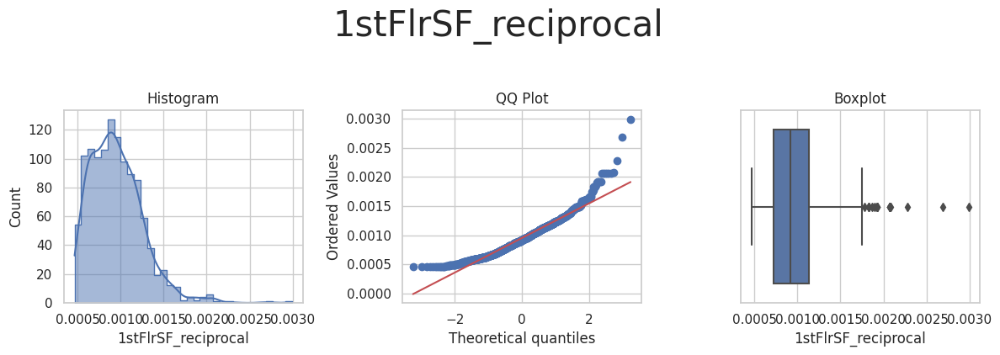

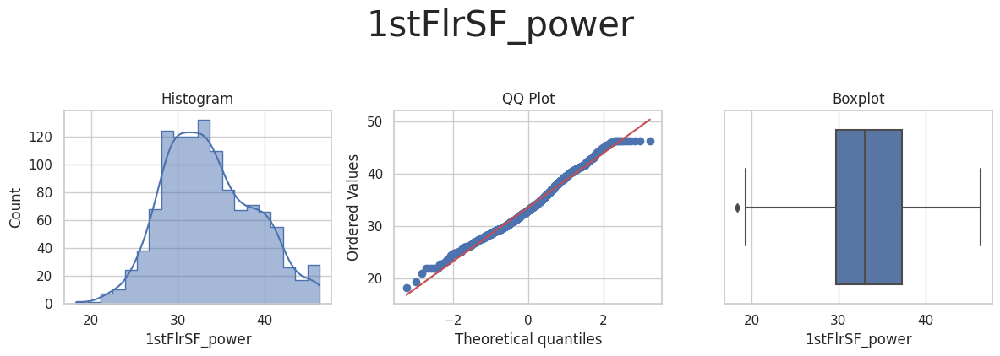

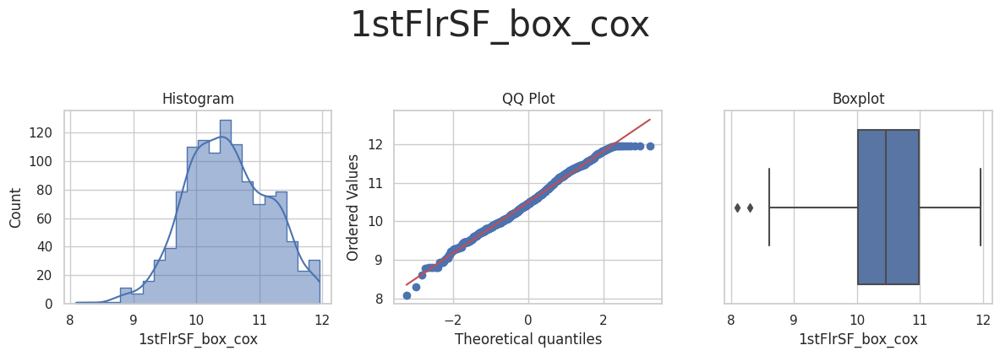

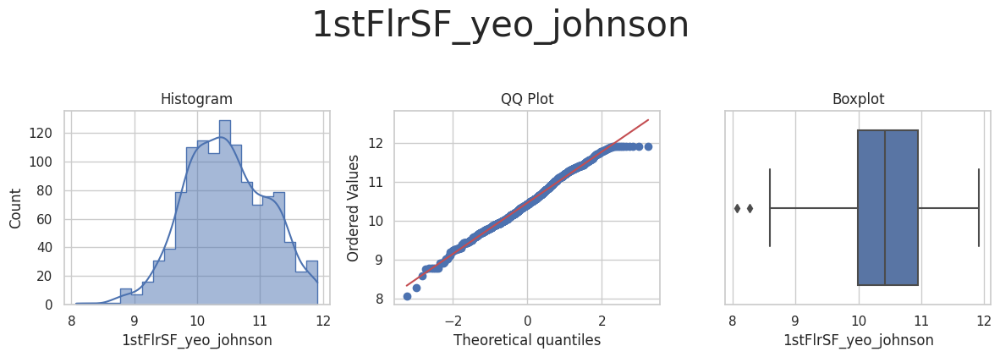



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_log_e', '2ndFlrSF_log_10', '2ndFlrSF_reciprocal', '2ndFlrSF_power', '2ndFlrSF_box_cox', '2ndFlrSF_yeo_johnson'] 



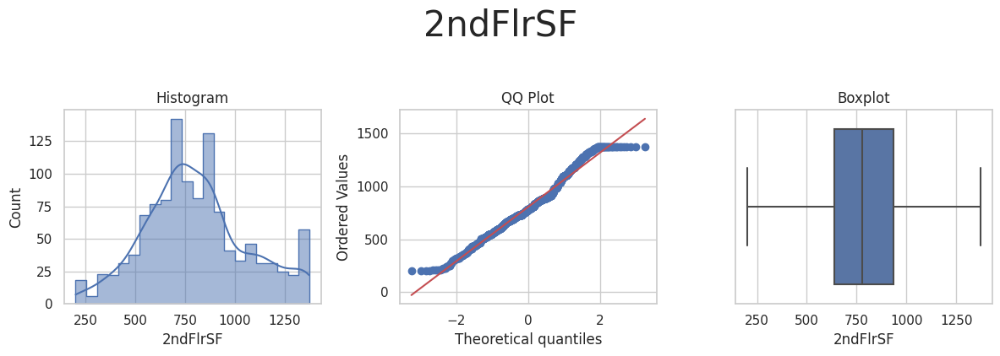

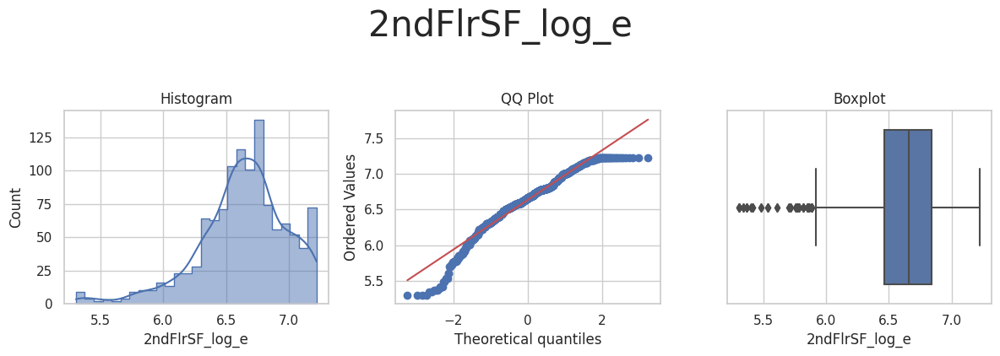

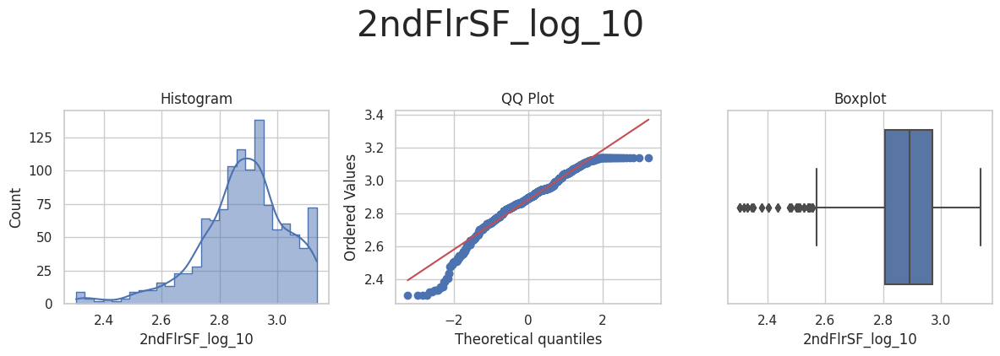

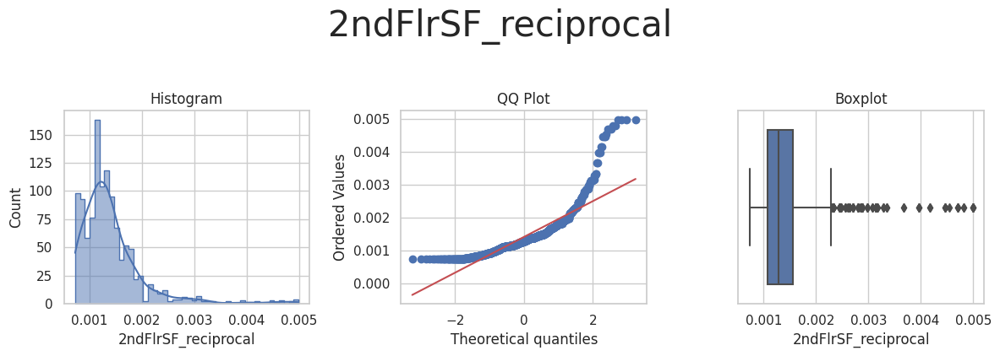

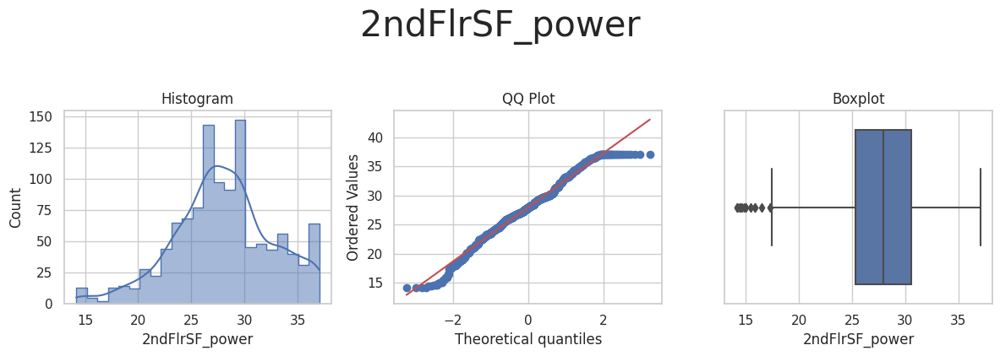

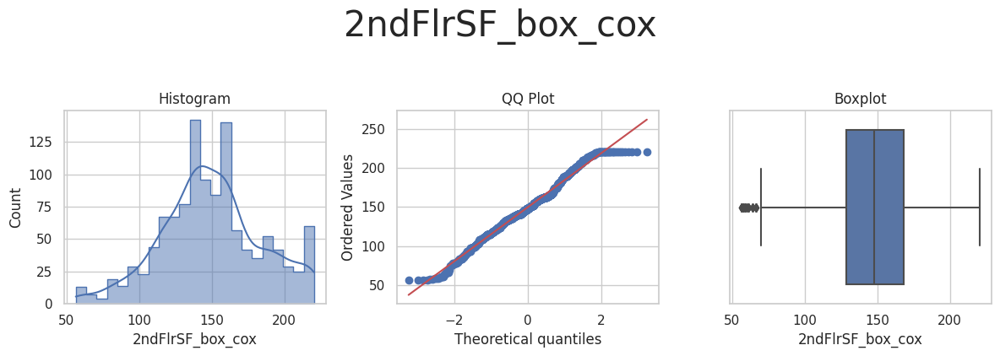

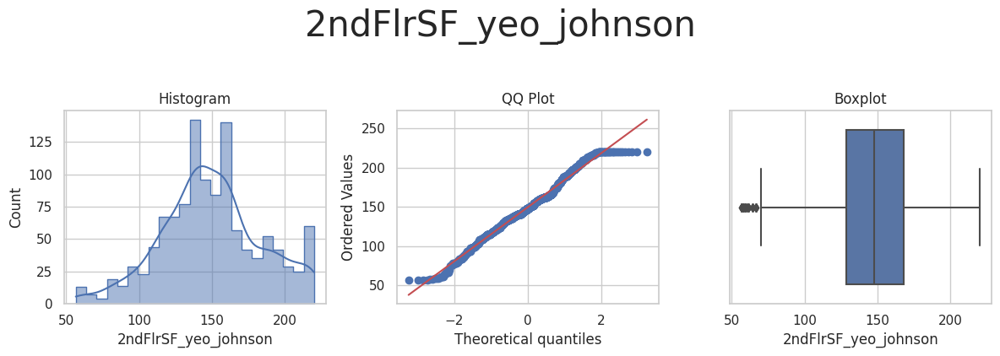



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



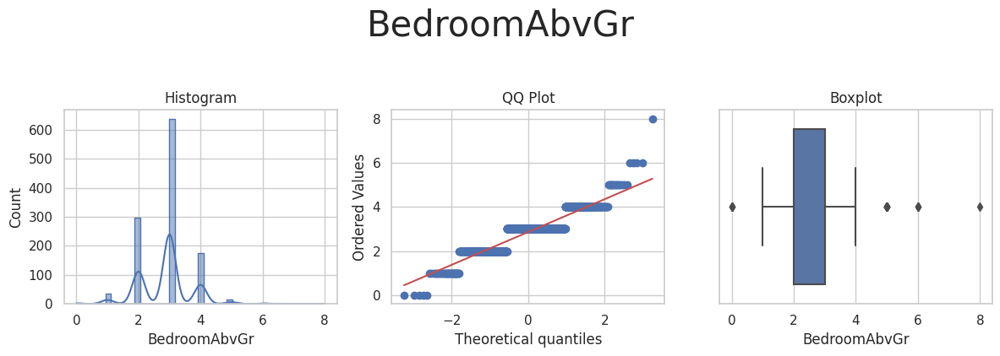

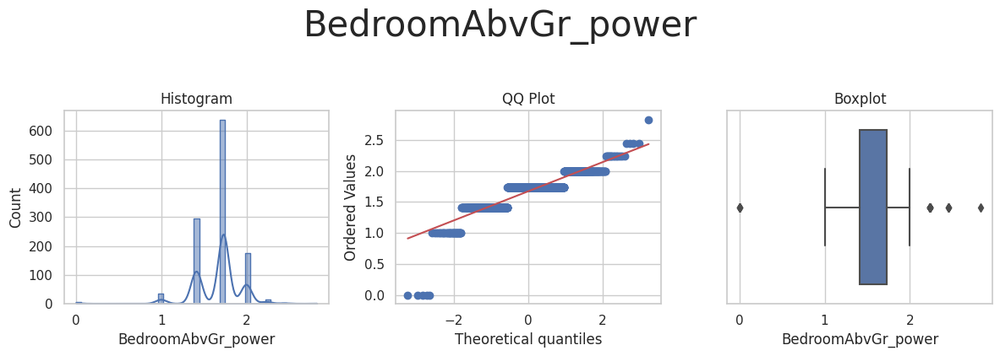

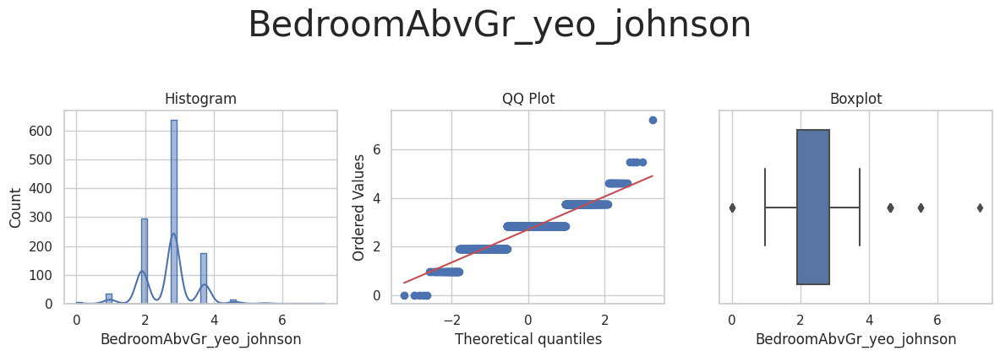



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_log_e', 'BsmtFinSF1_log_10', 'BsmtFinSF1_reciprocal', 'BsmtFinSF1_power', 'BsmtFinSF1_box_cox', 'BsmtFinSF1_yeo_johnson'] 



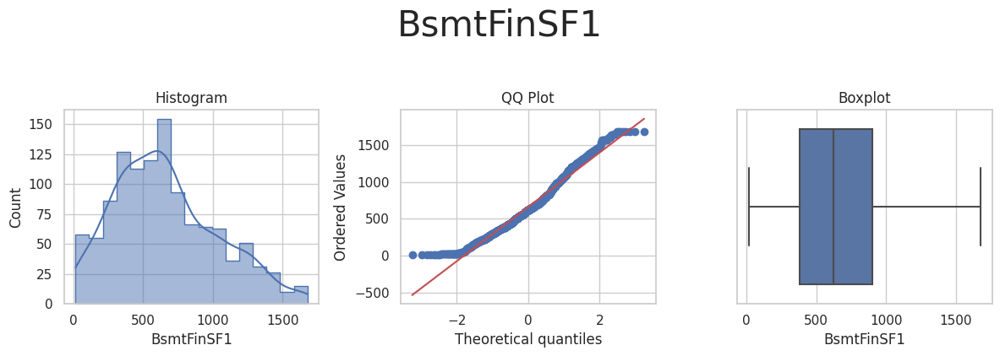

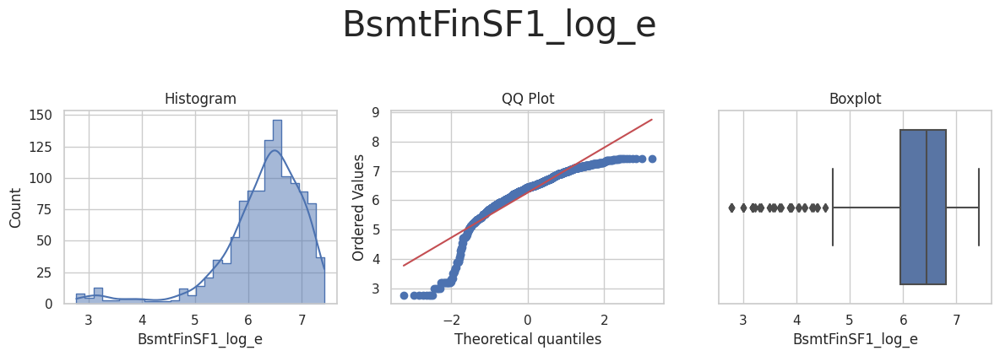

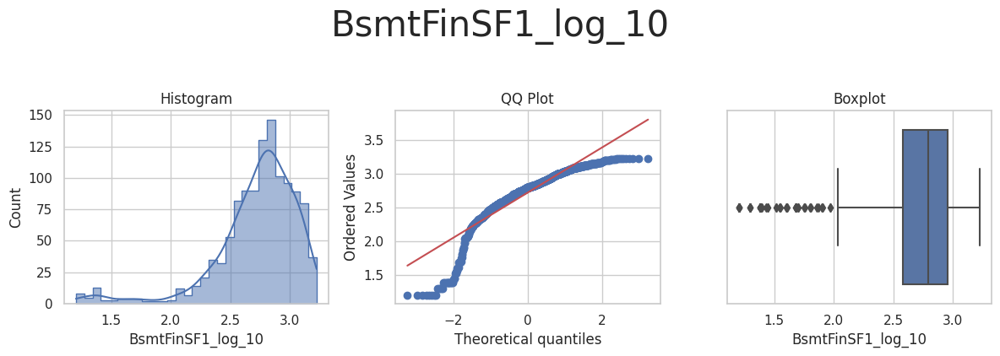

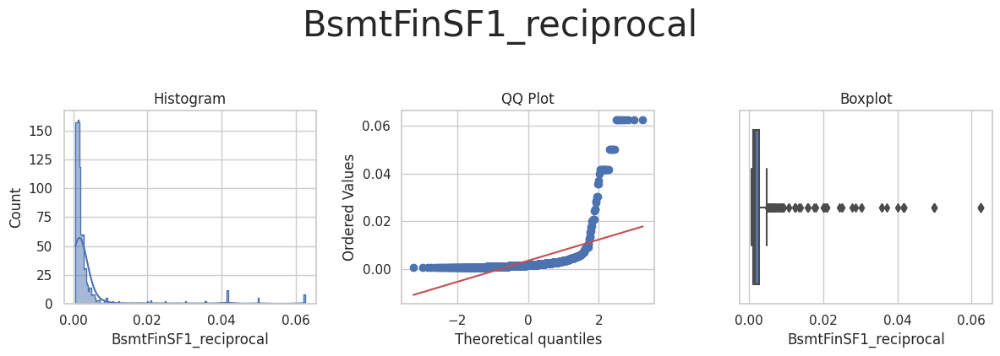

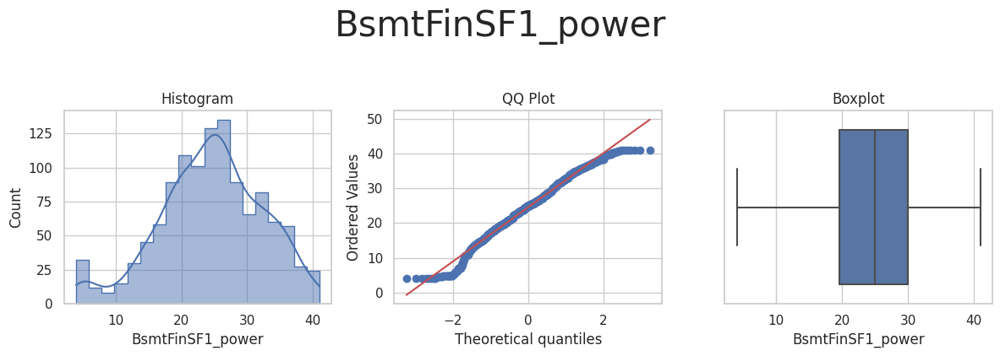

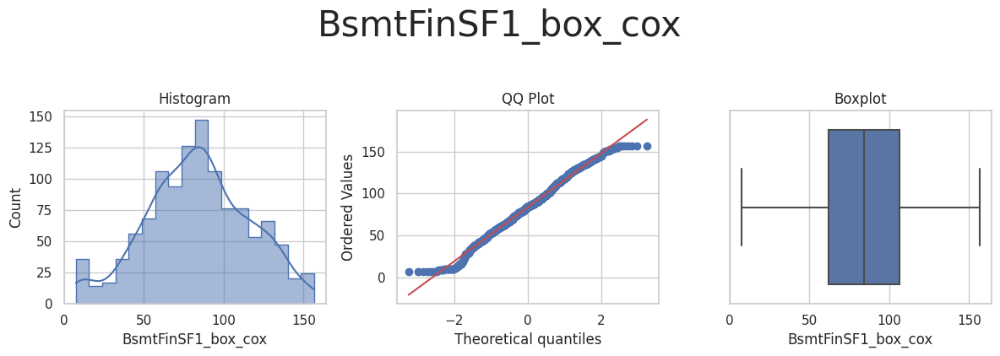

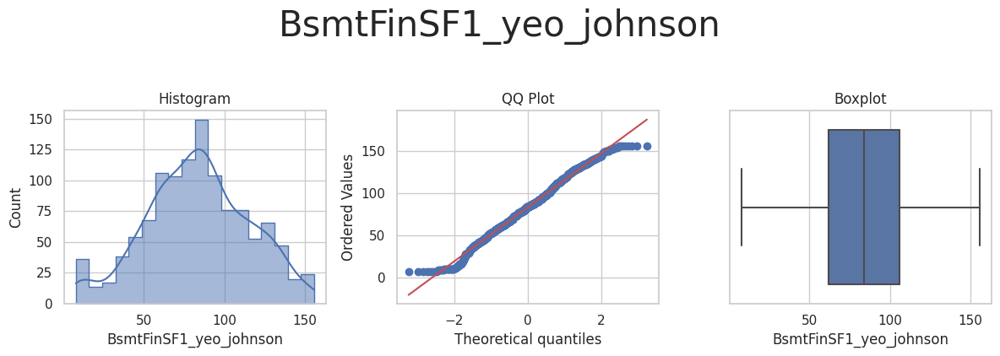



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_log_e', 'BsmtUnfSF_log_10', 'BsmtUnfSF_reciprocal', 'BsmtUnfSF_power', 'BsmtUnfSF_box_cox', 'BsmtUnfSF_yeo_johnson'] 



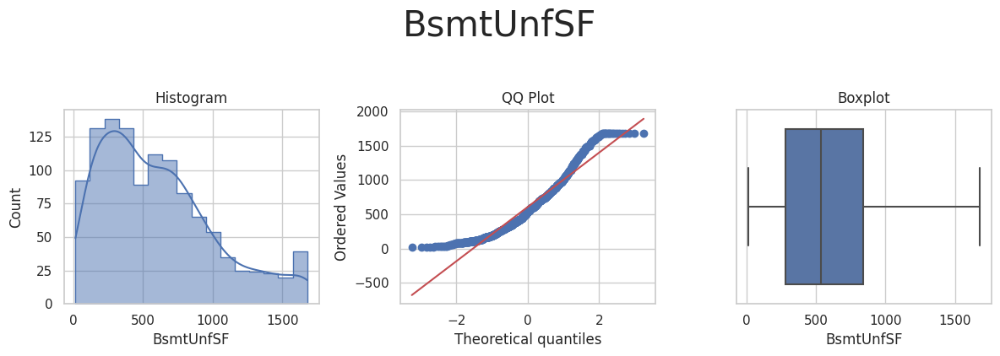

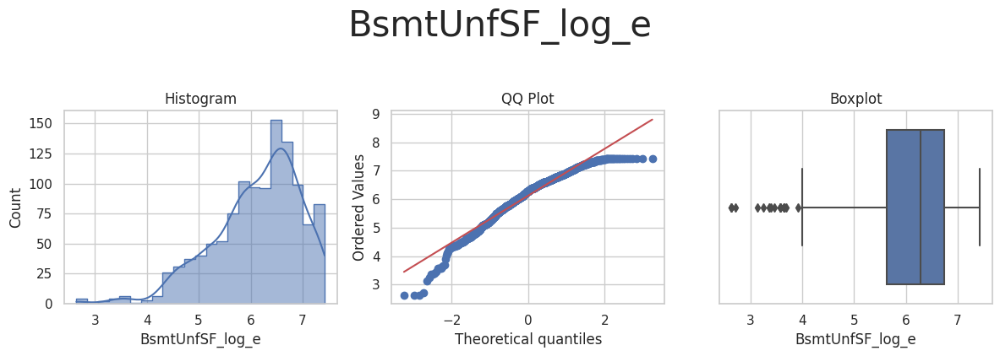

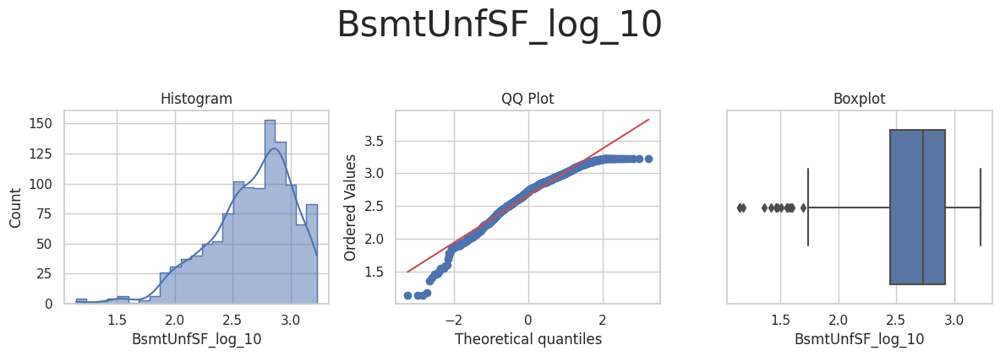

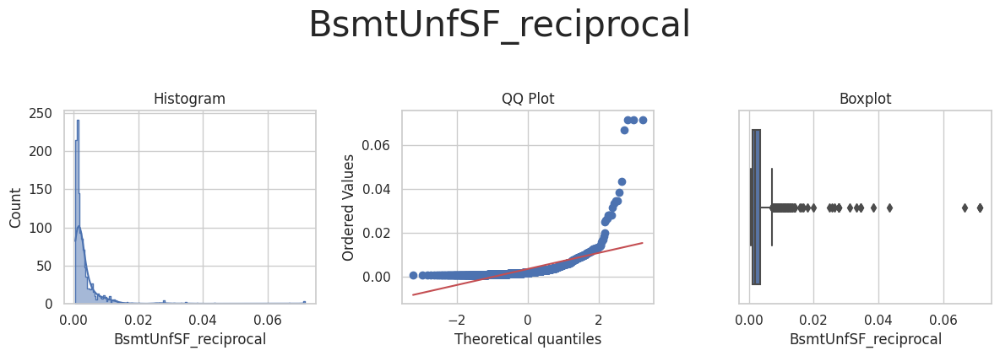

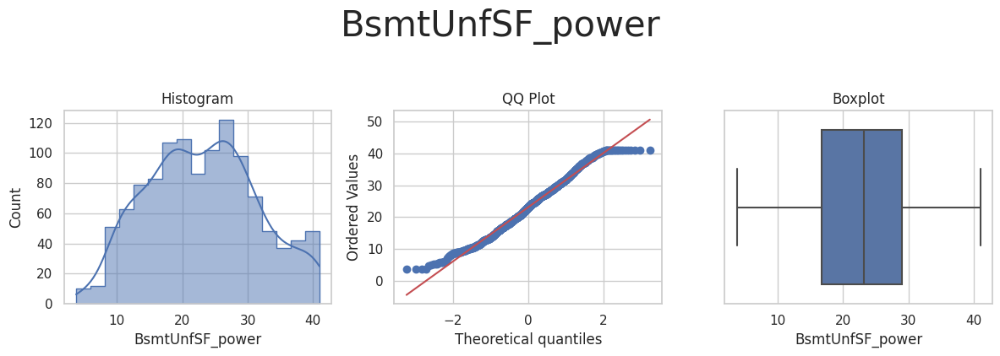

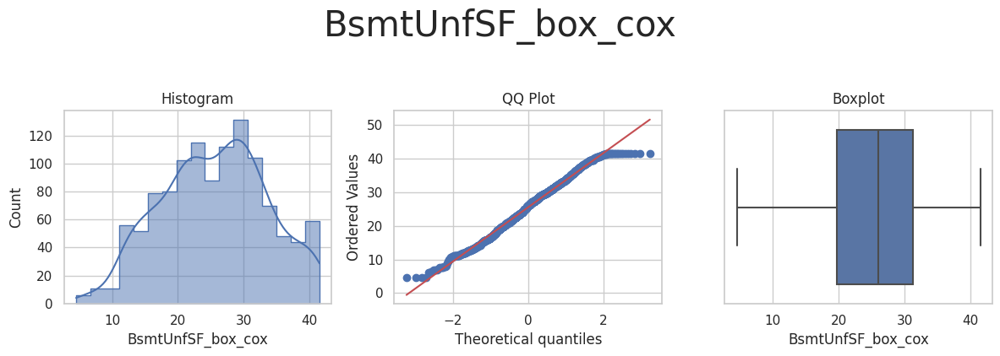

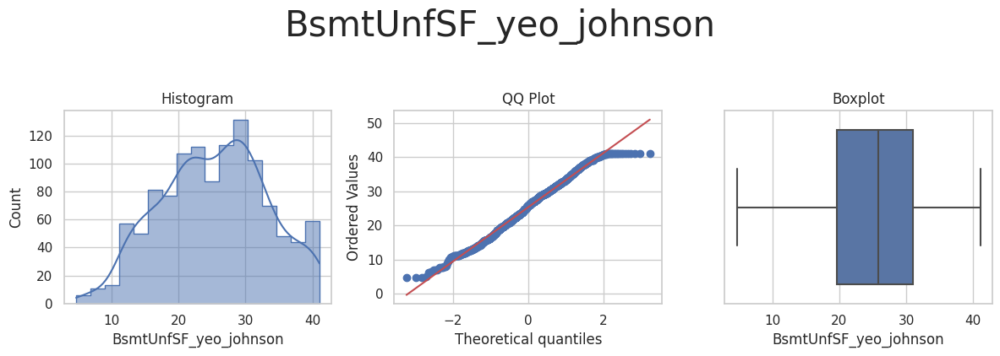



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_log_e', 'GarageArea_log_10', 'GarageArea_reciprocal', 'GarageArea_power', 'GarageArea_box_cox', 'GarageArea_yeo_johnson'] 



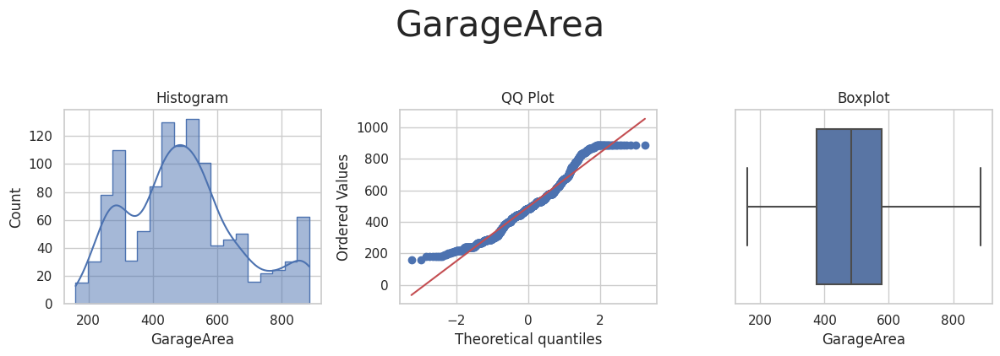

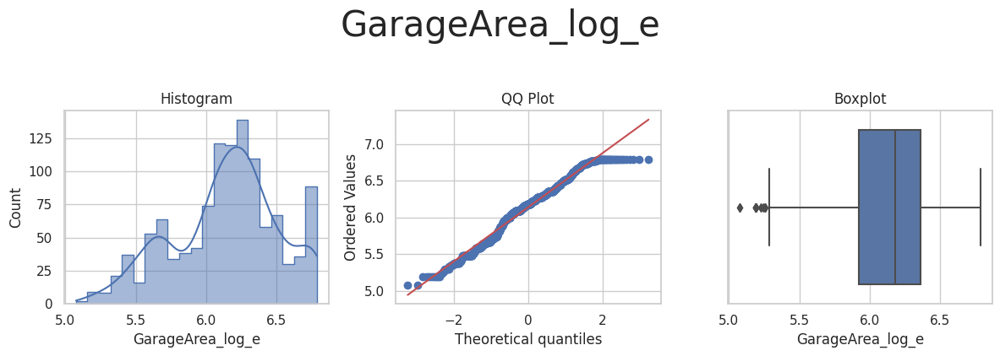

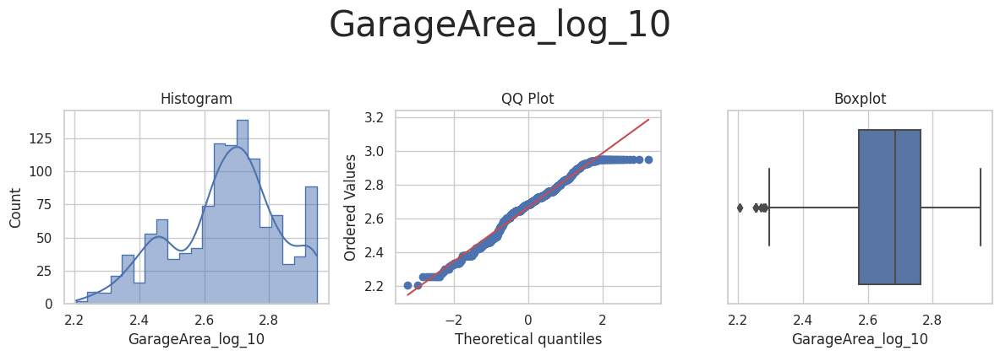

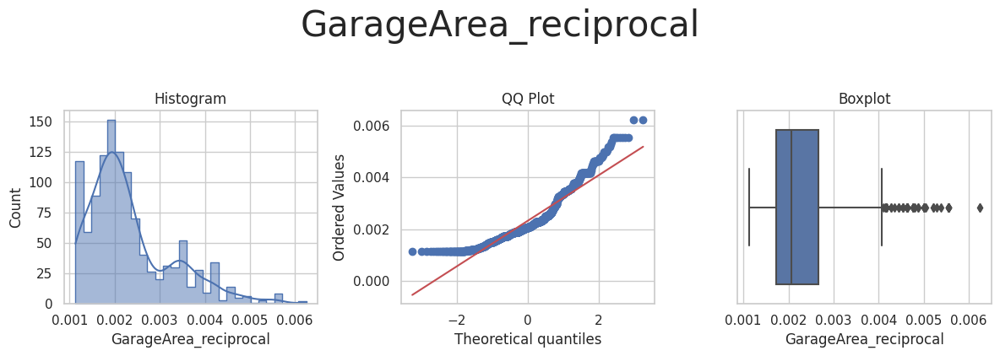

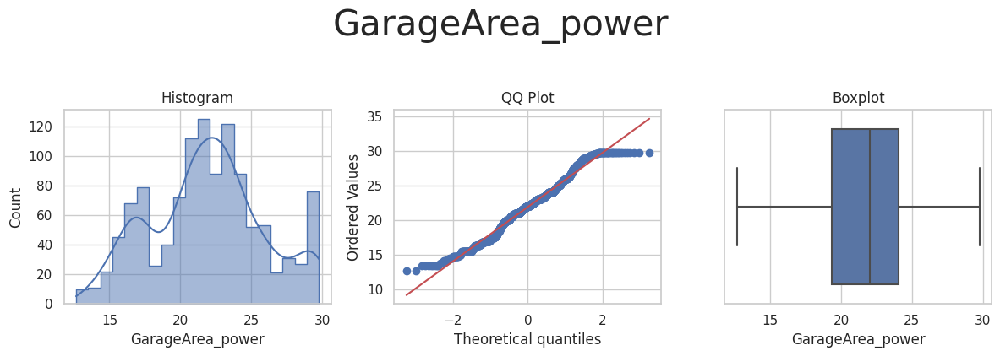

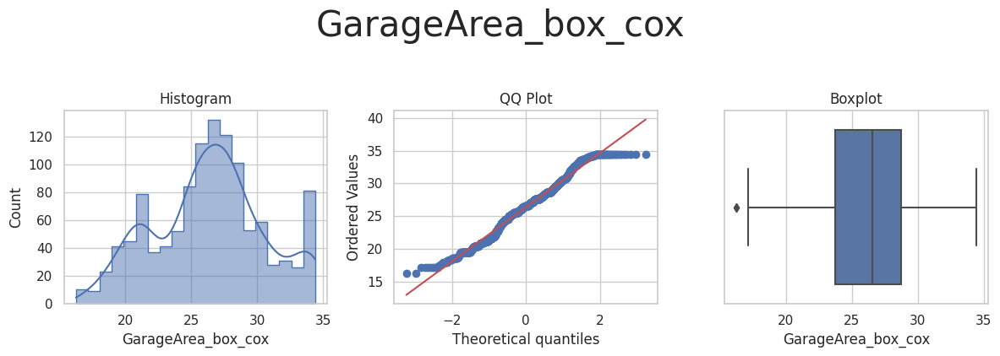

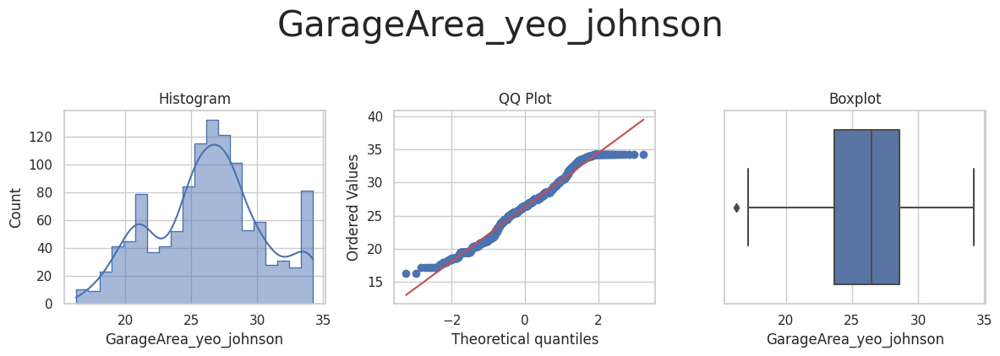



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



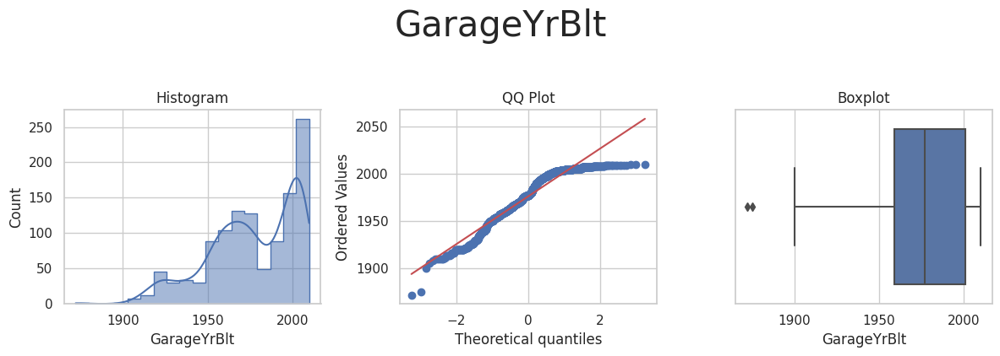

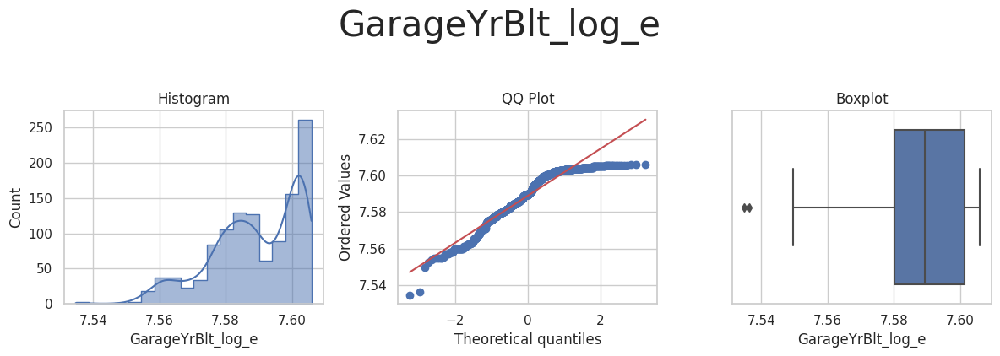

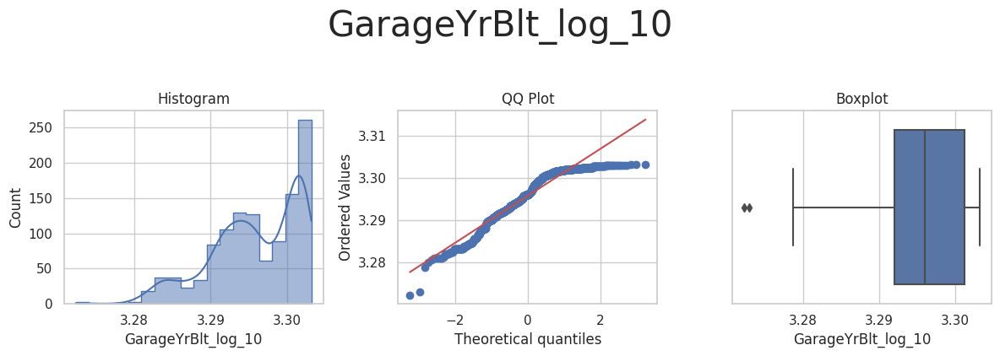

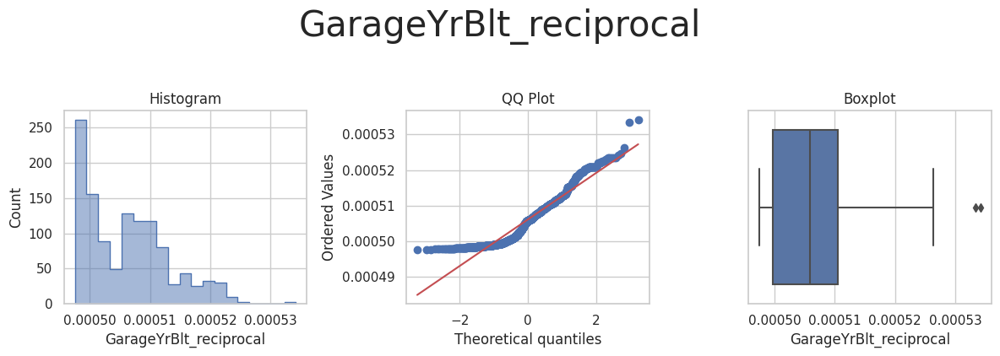

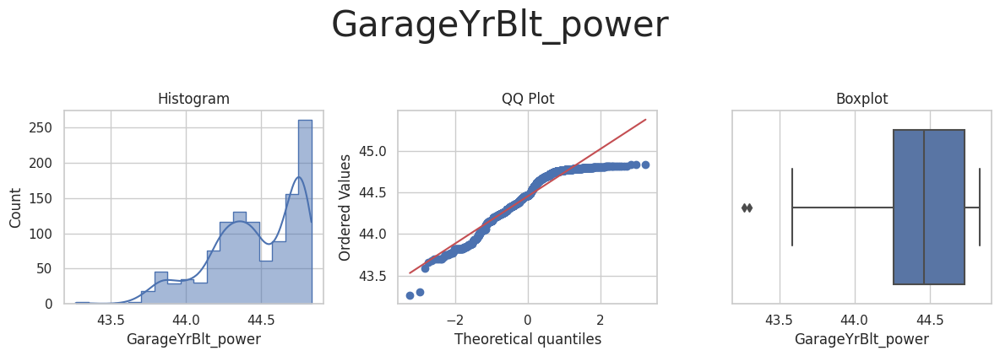

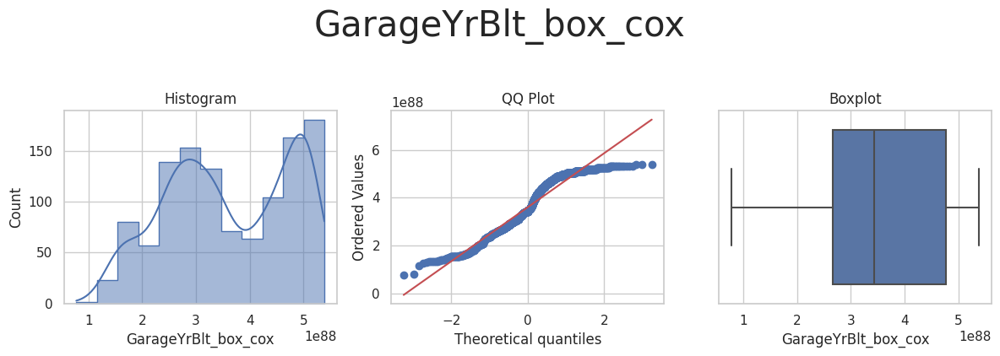

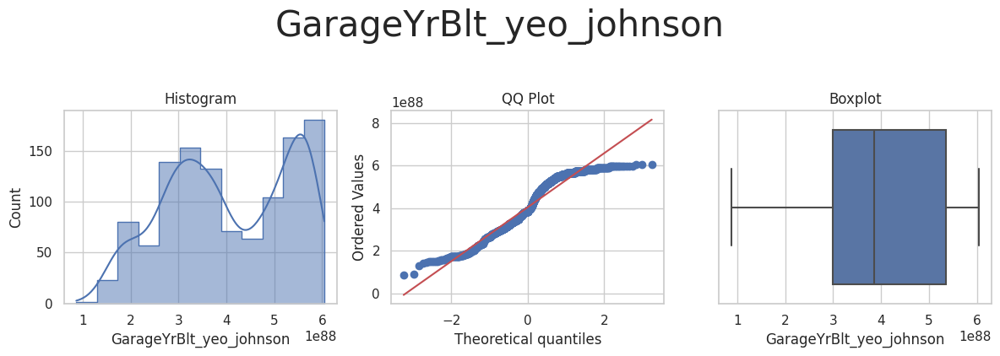



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



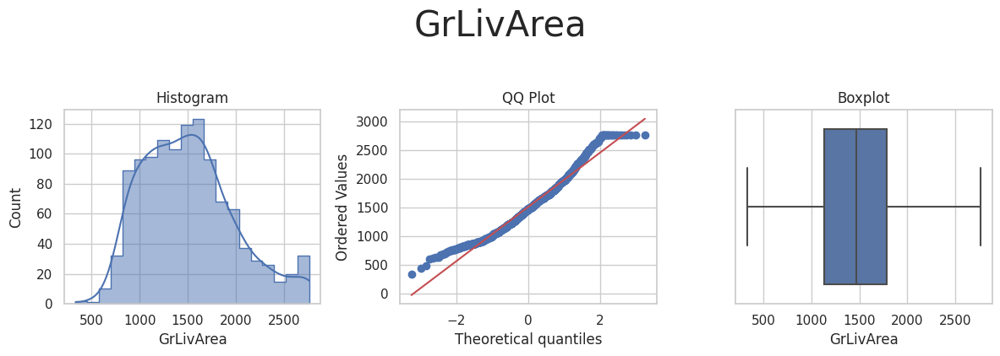

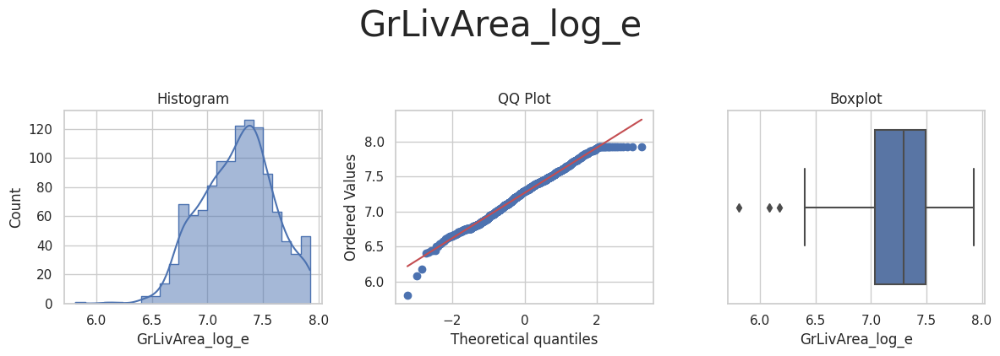

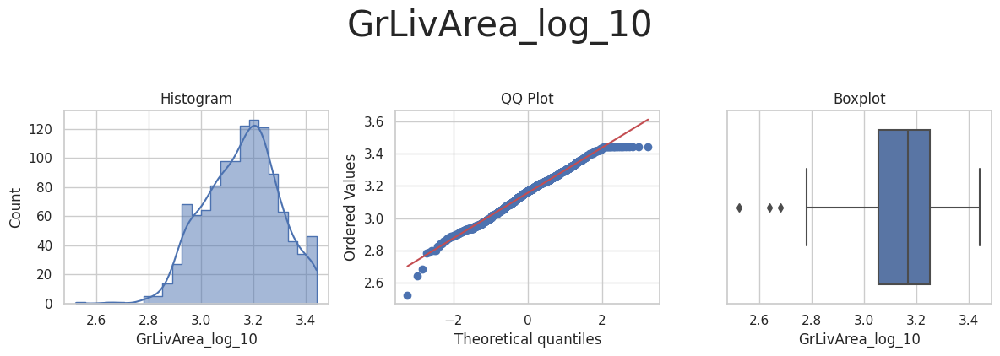

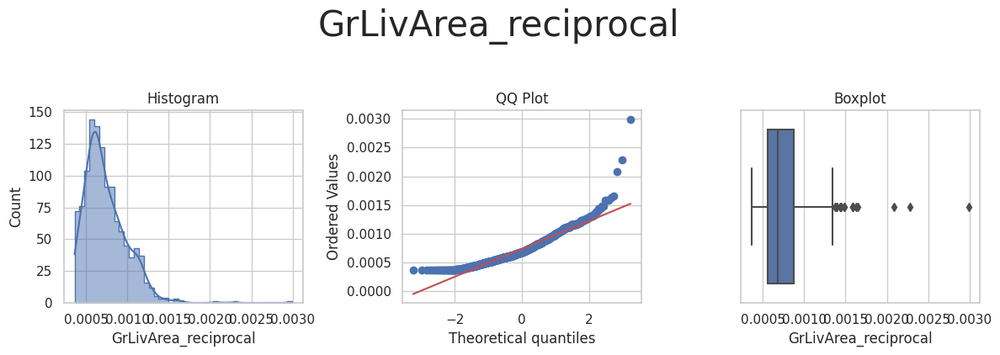

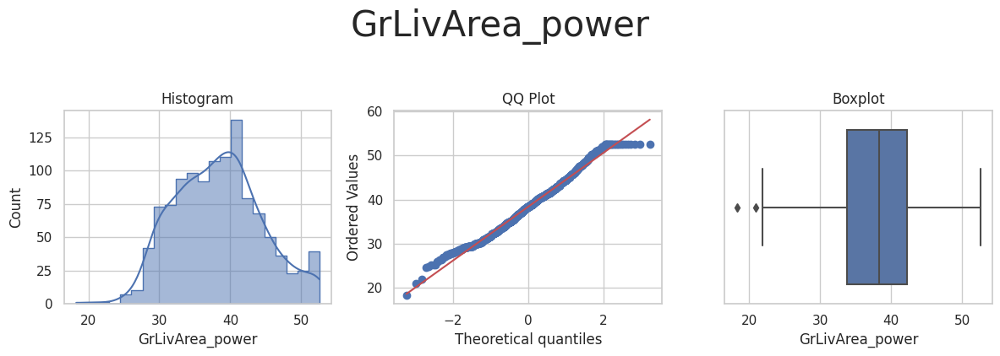

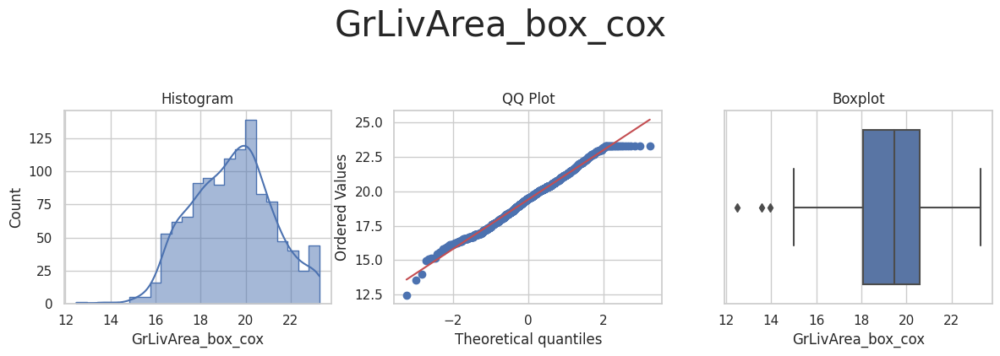

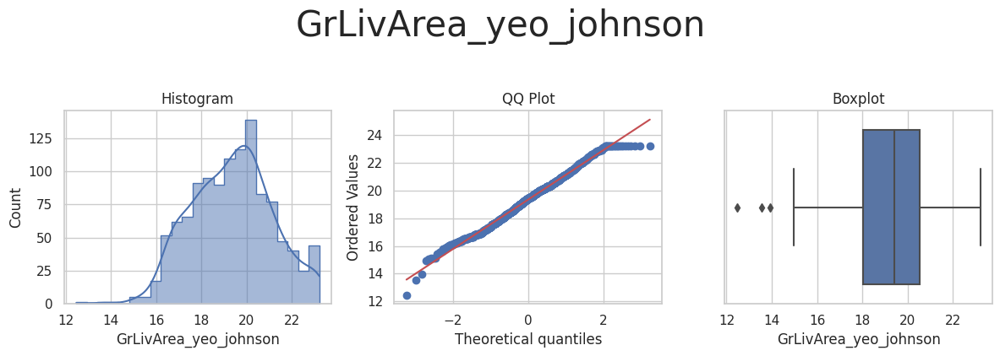



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



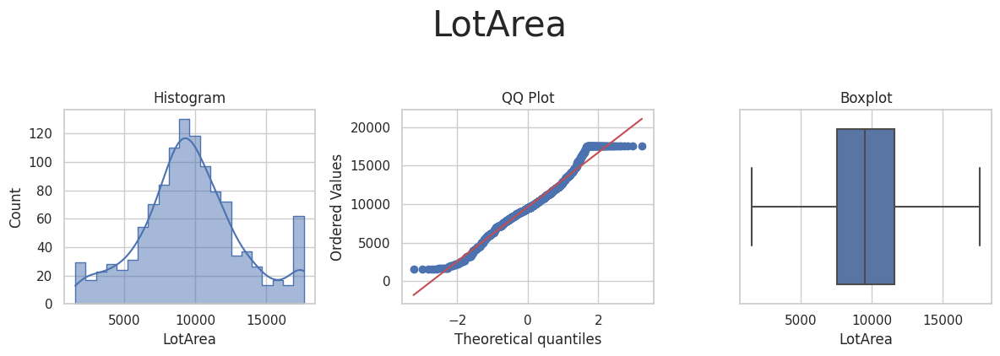

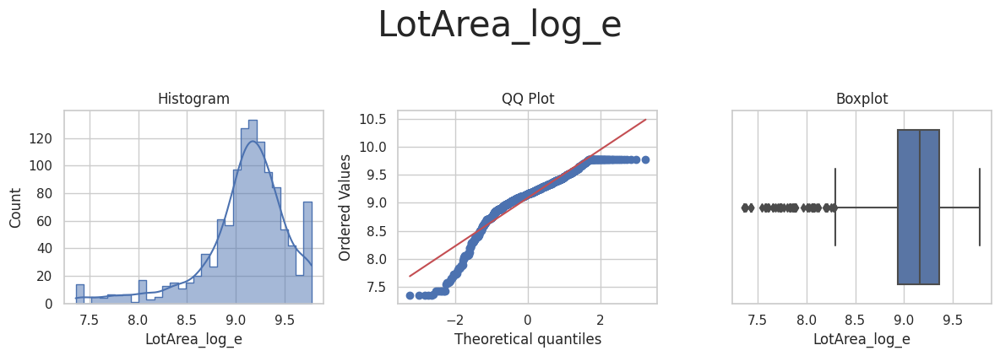

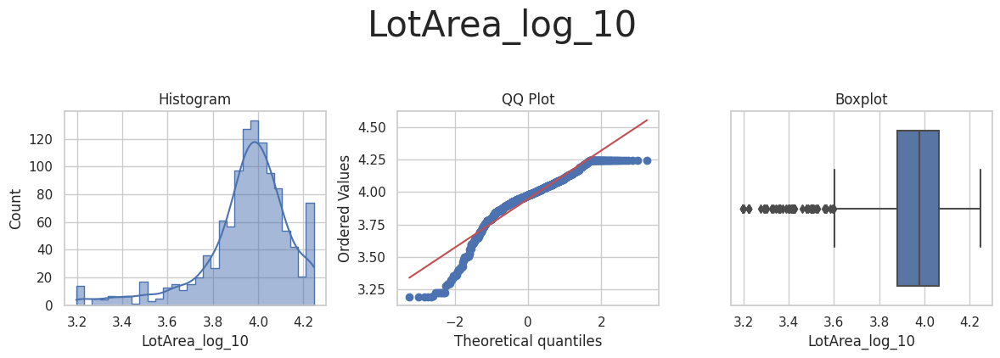

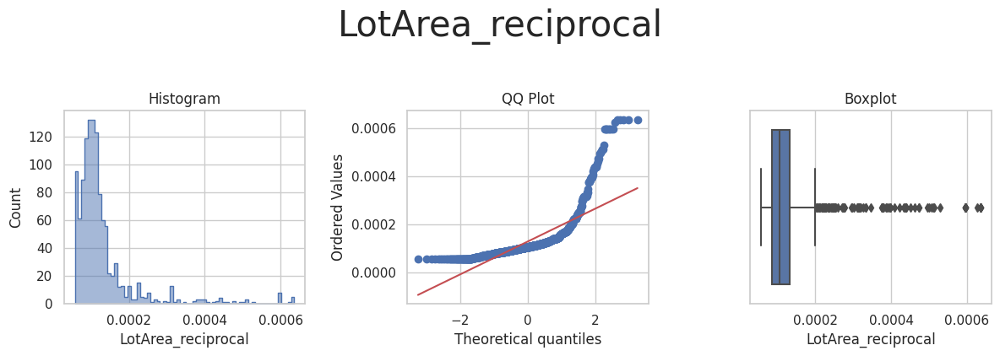

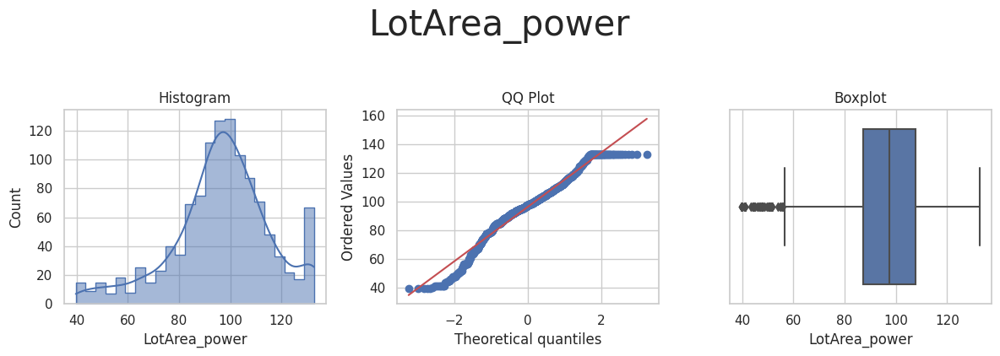

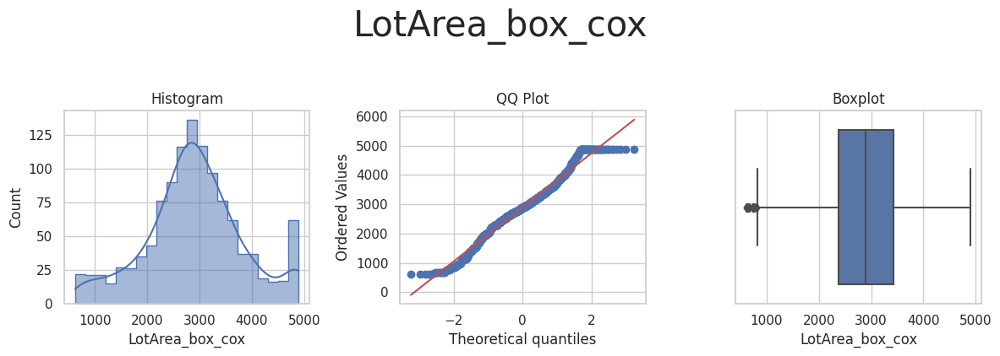

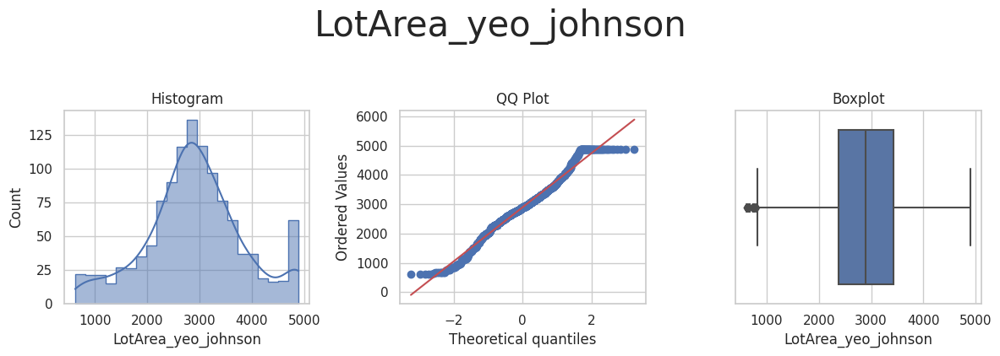



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



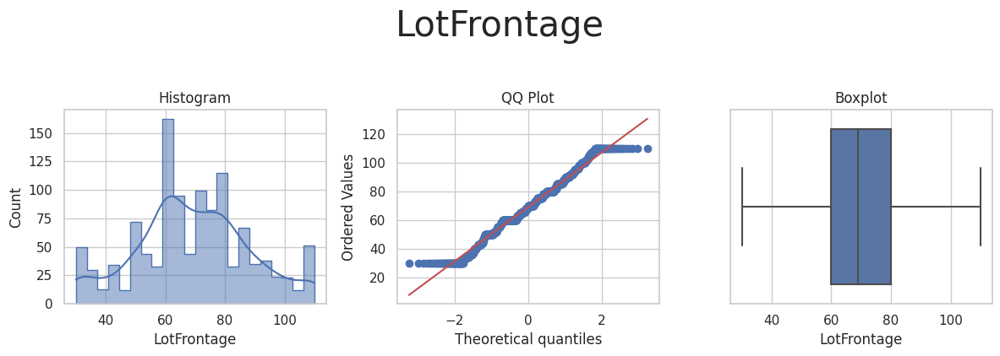

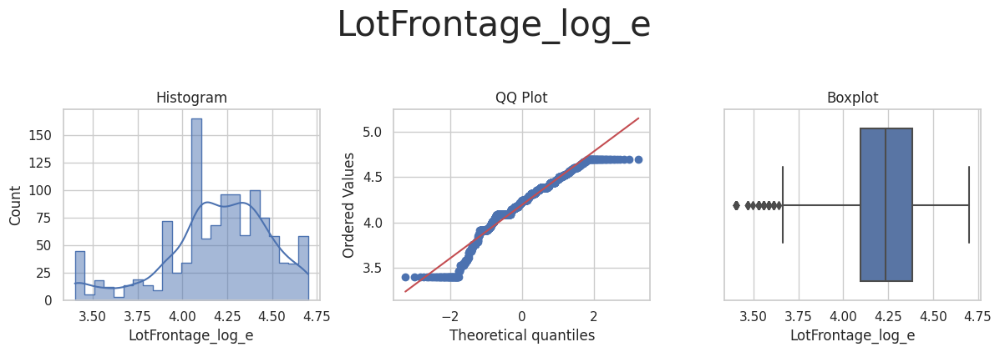

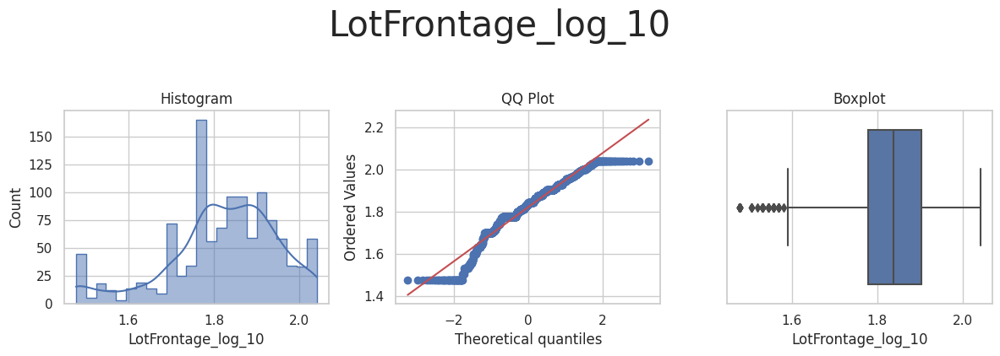

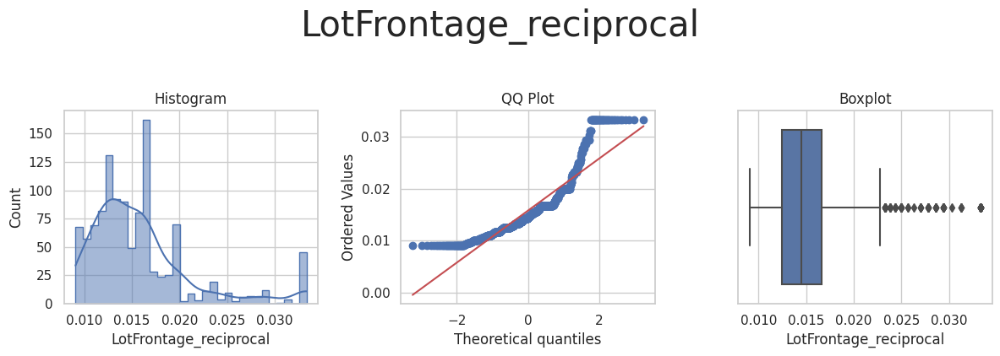

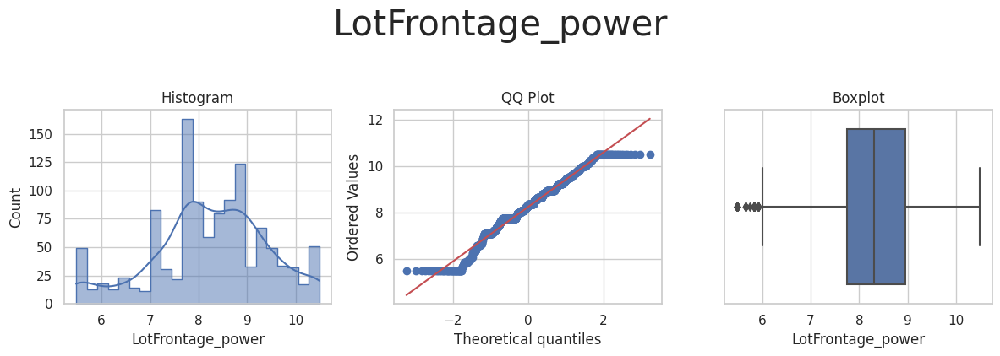

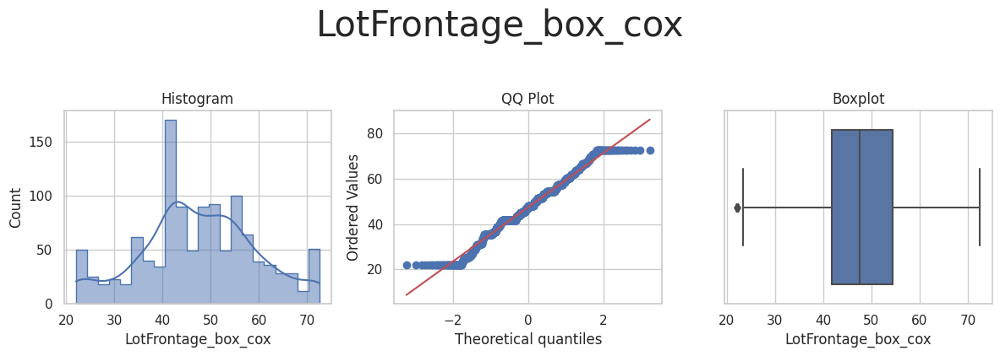

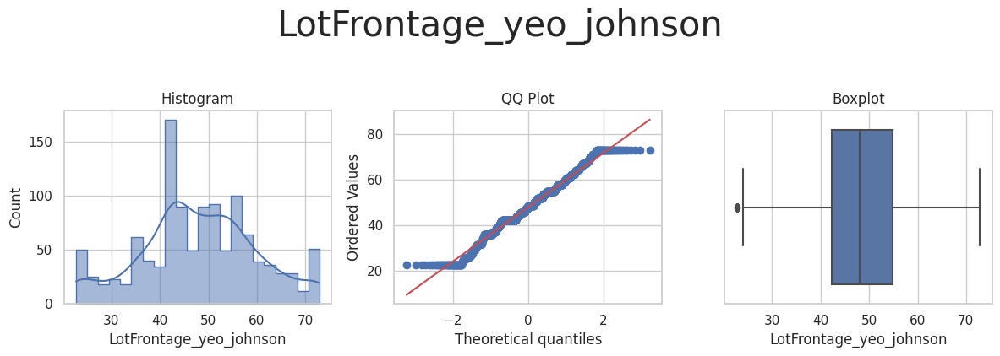



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_log_e', 'MasVnrArea_log_10', 'MasVnrArea_reciprocal', 'MasVnrArea_power', 'MasVnrArea_box_cox', 'MasVnrArea_yeo_johnson'] 



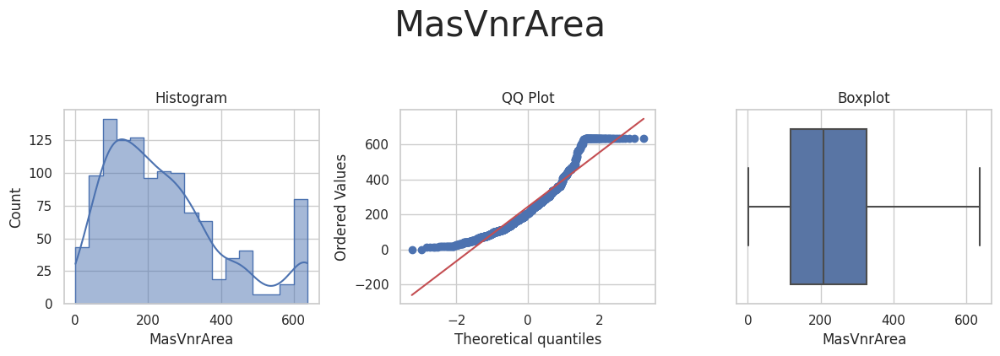

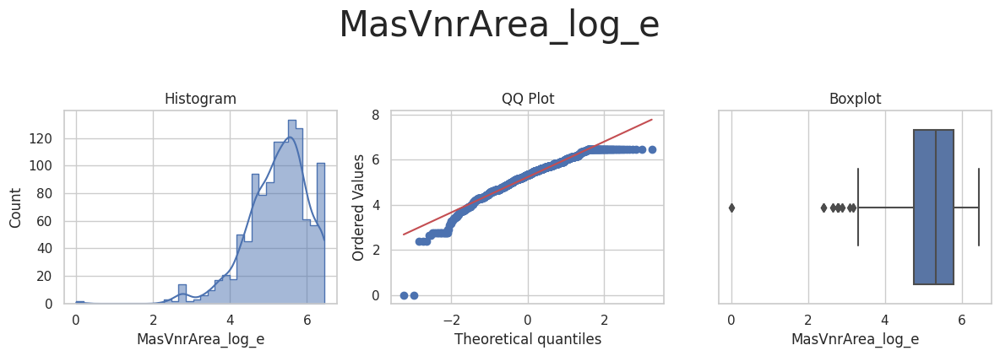

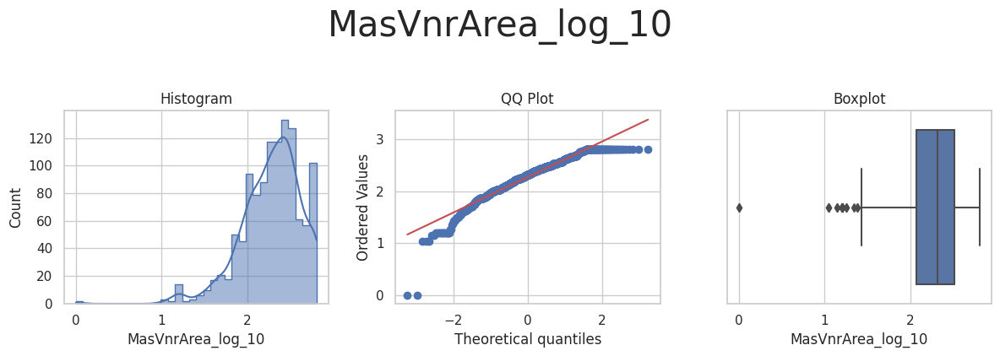

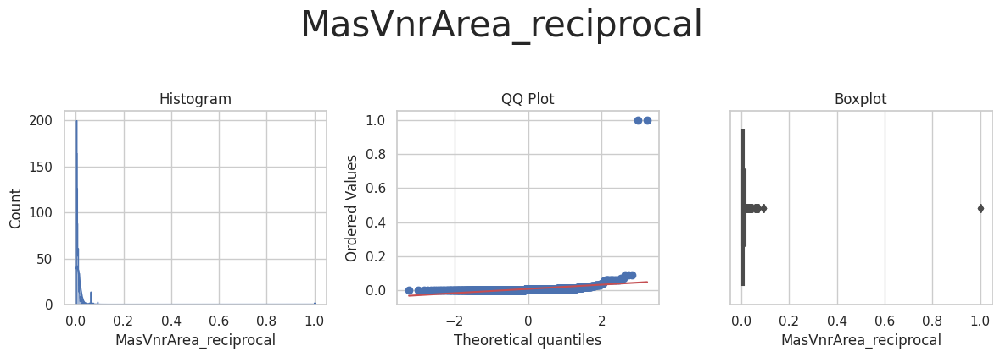

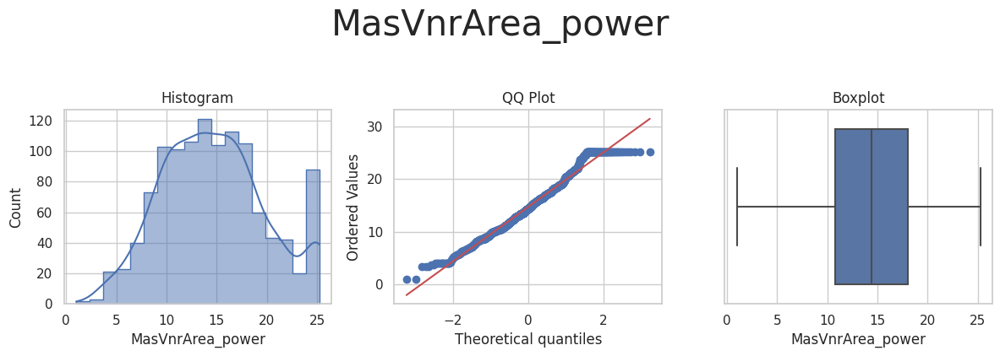

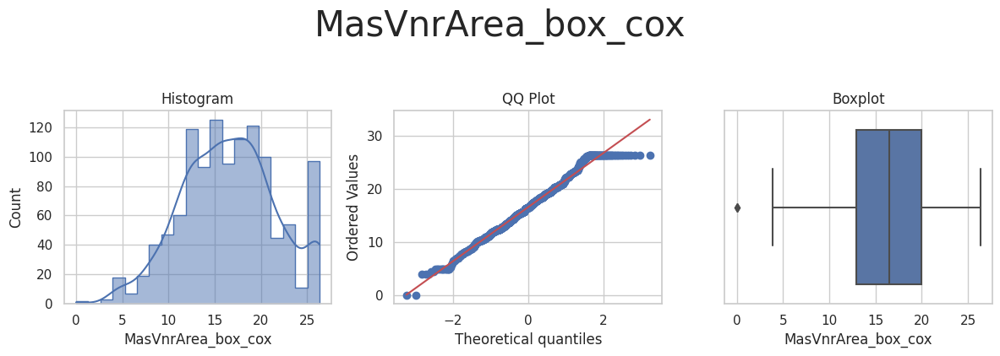

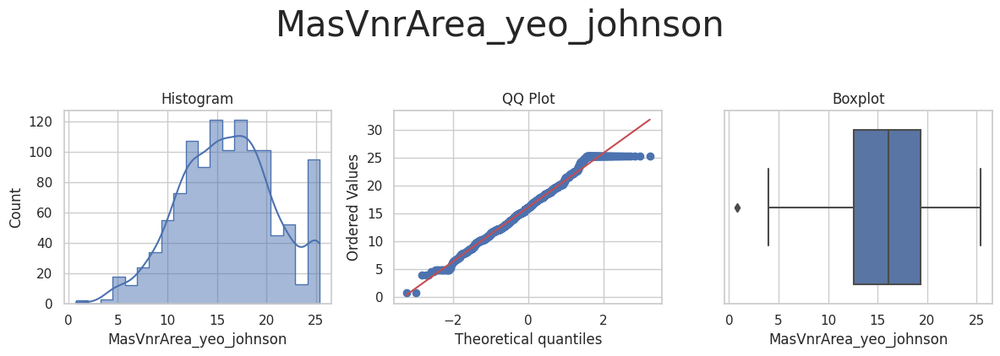



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_log_e', 'OpenPorchSF_log_10', 'OpenPorchSF_reciprocal', 'OpenPorchSF_power', 'OpenPorchSF_box_cox', 'OpenPorchSF_yeo_johnson'] 



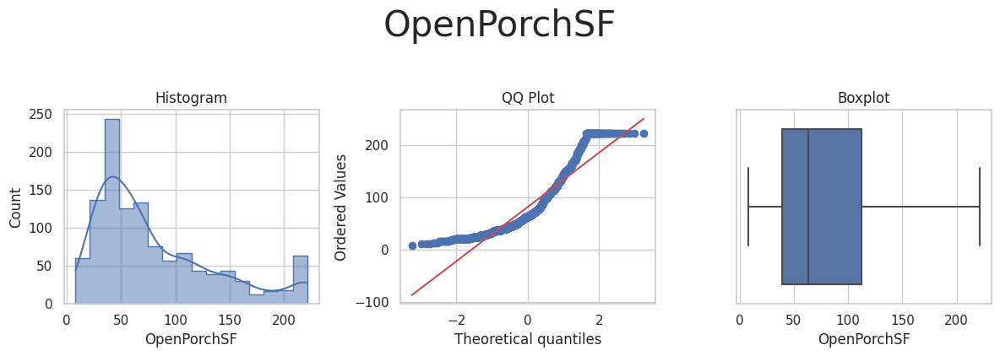

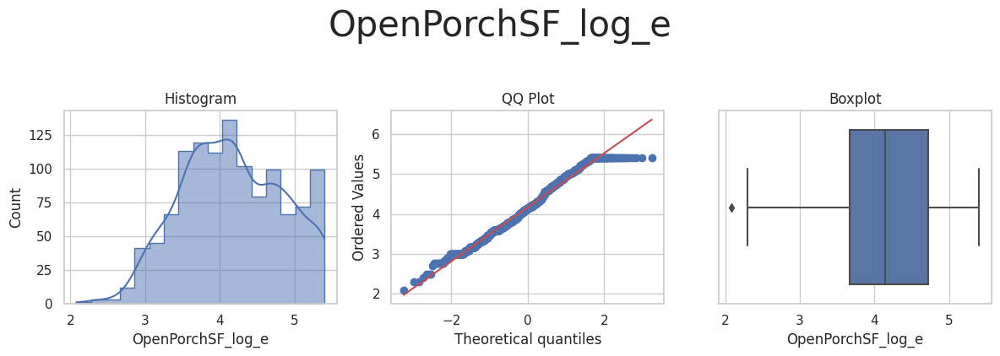

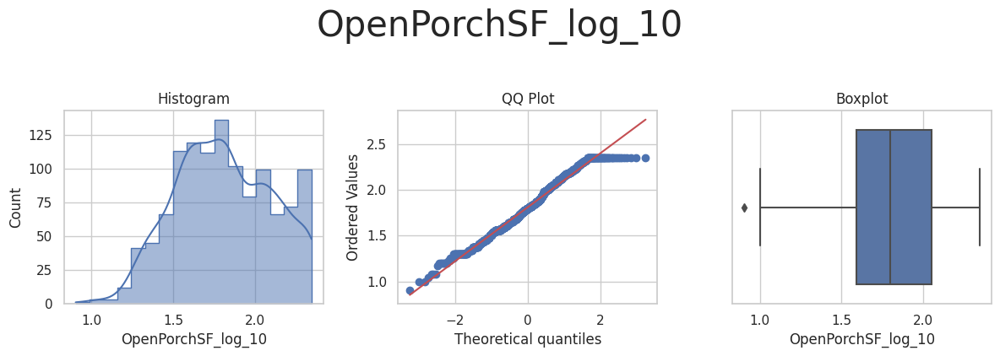

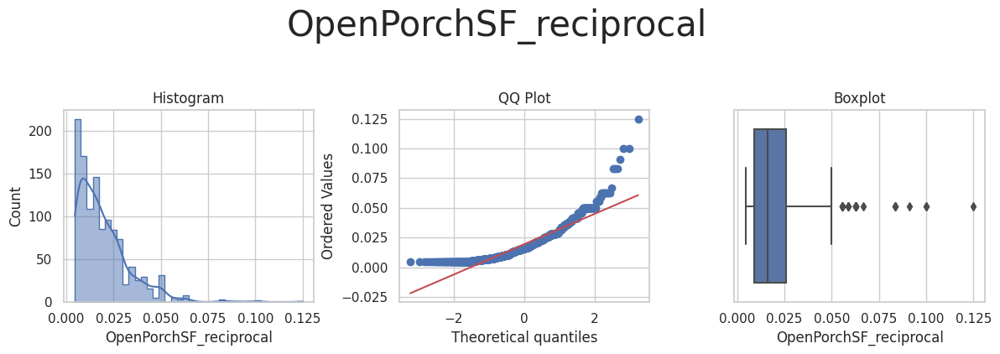

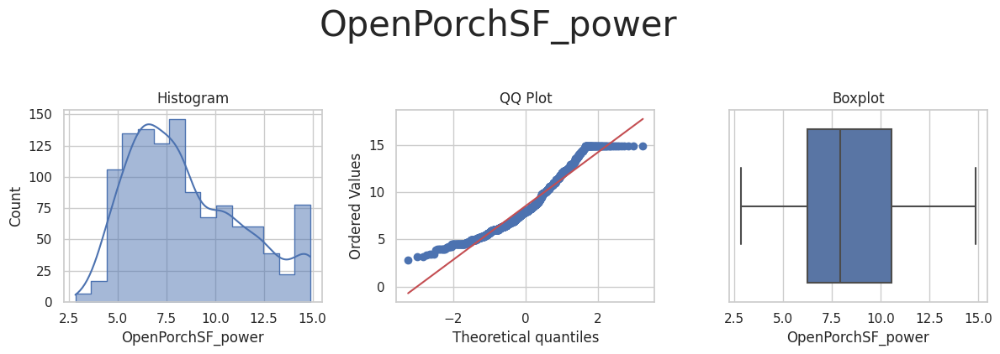

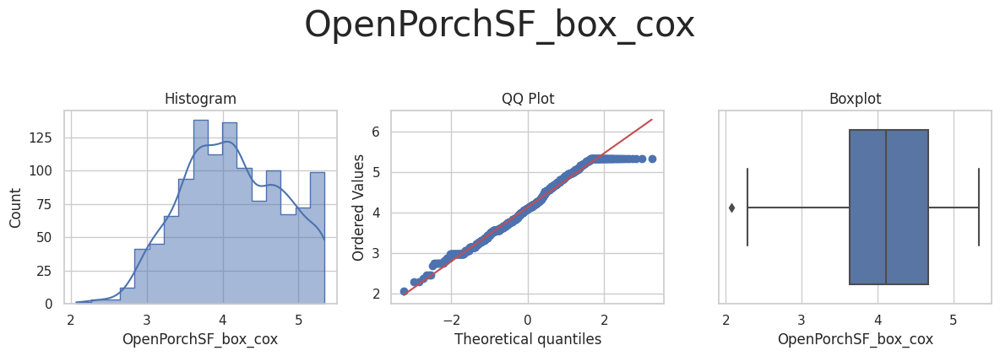

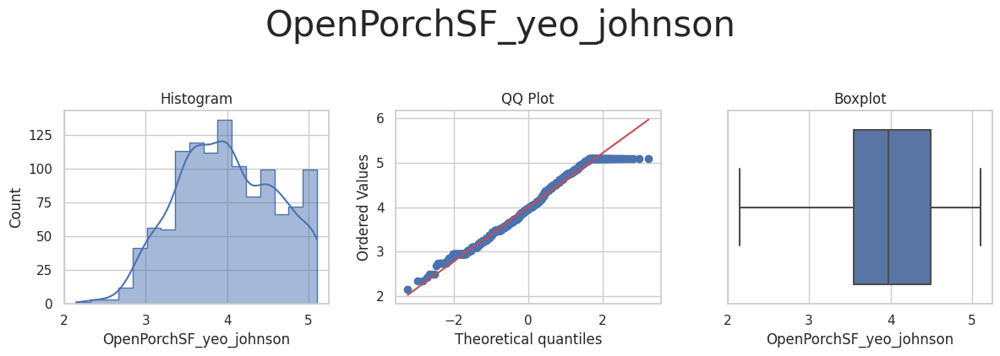



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_log_e', 'TotalBsmtSF_log_10', 'TotalBsmtSF_reciprocal', 'TotalBsmtSF_power', 'TotalBsmtSF_box_cox', 'TotalBsmtSF_yeo_johnson'] 



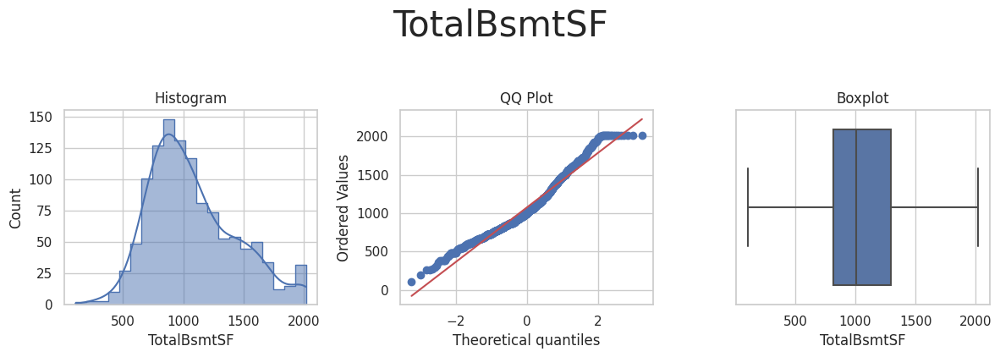

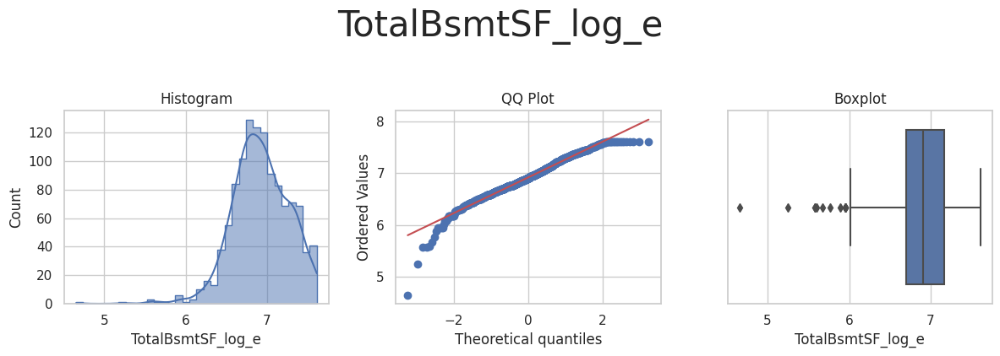

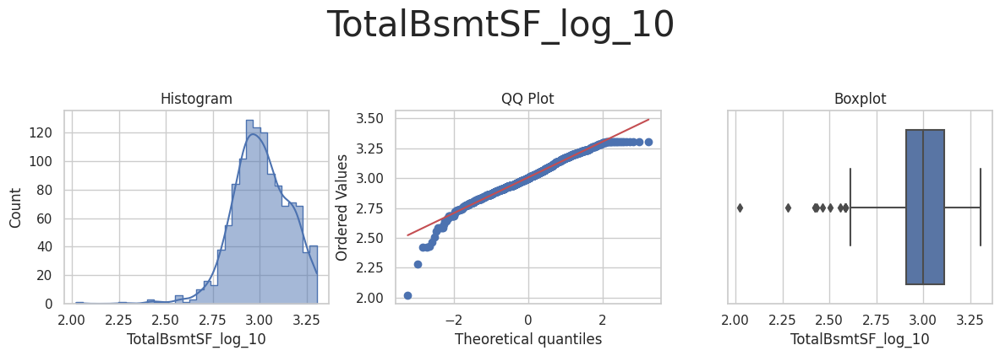

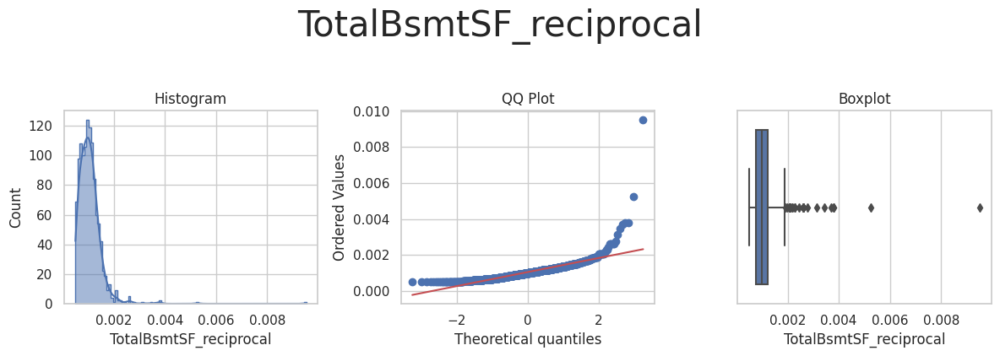

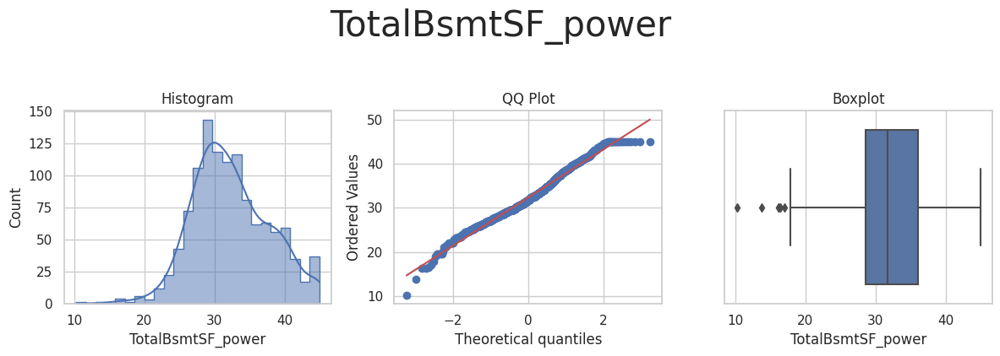

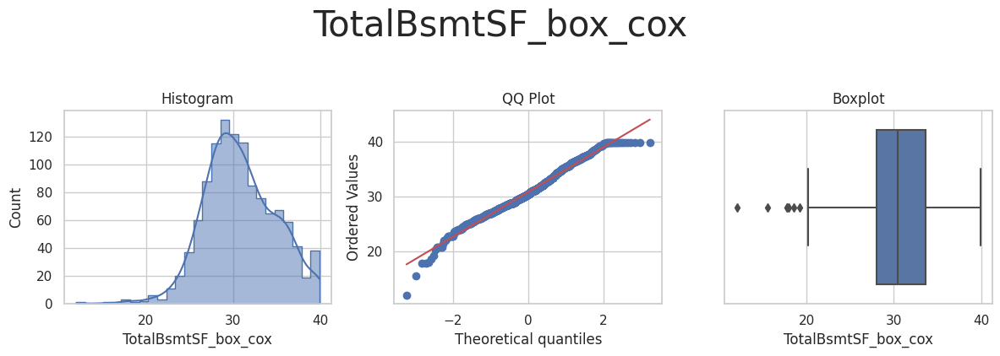

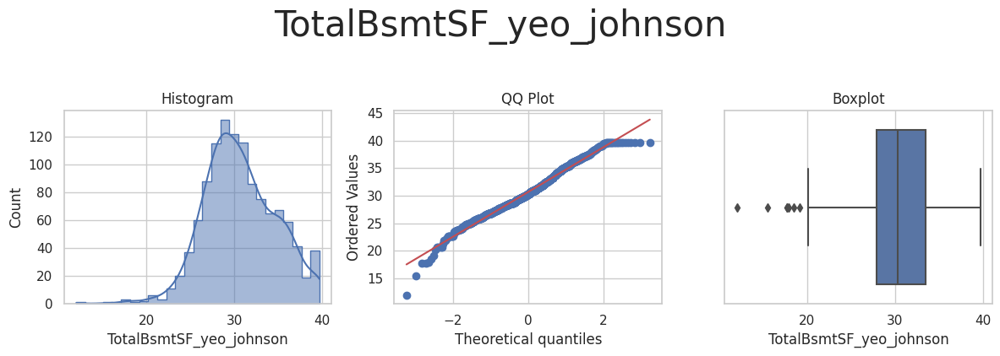



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



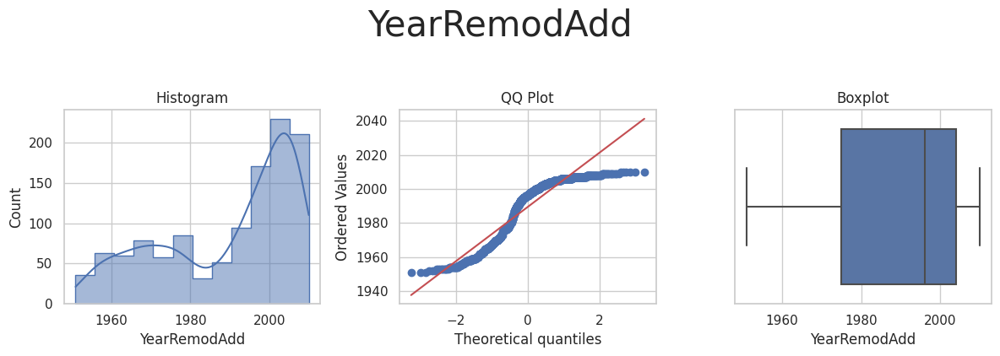

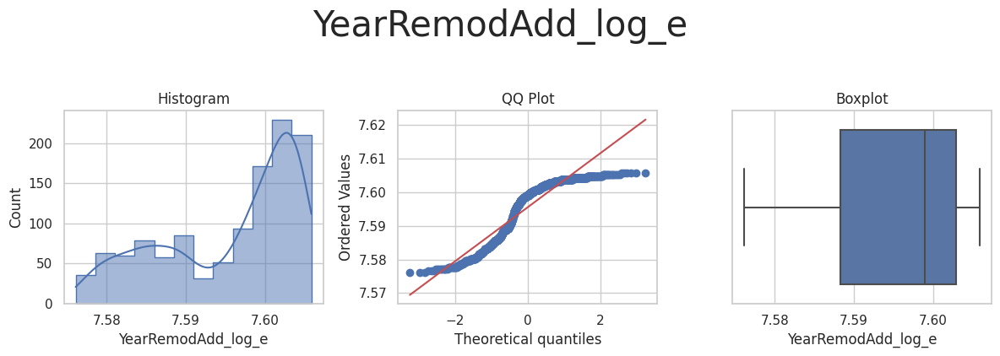

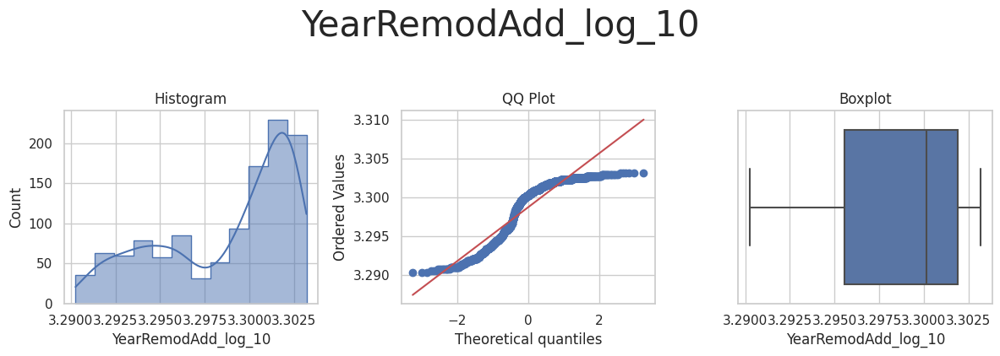

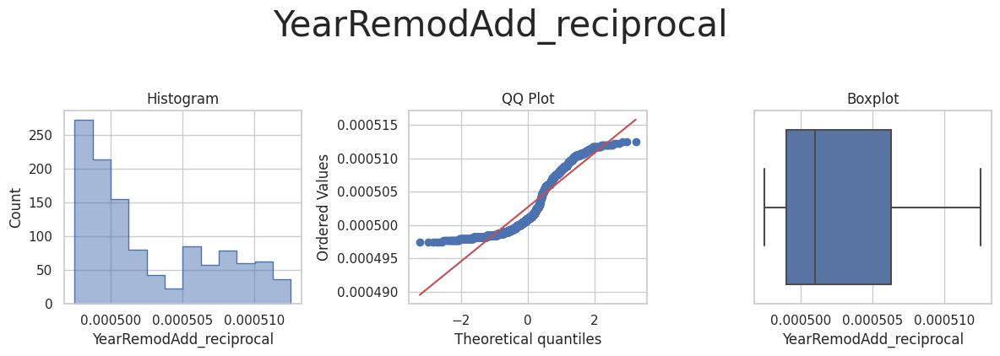

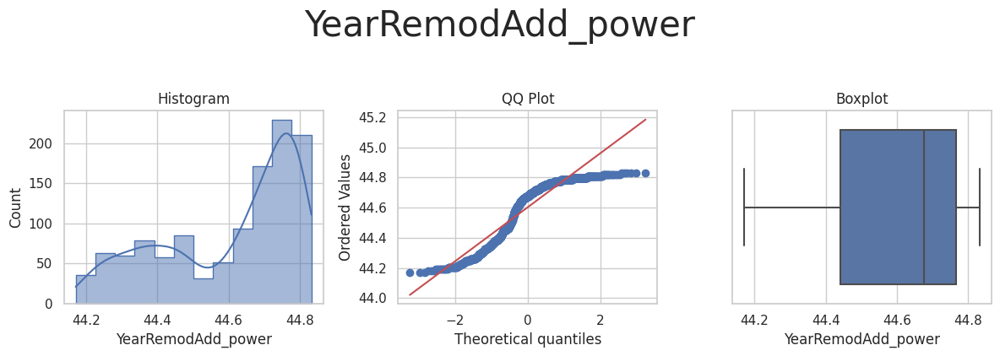

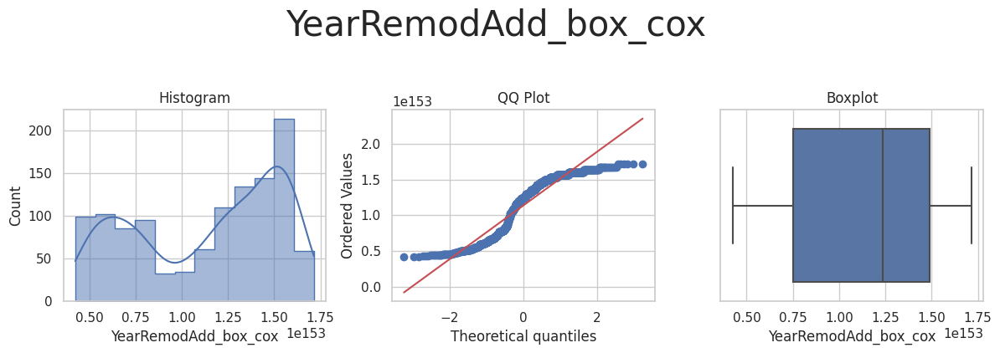

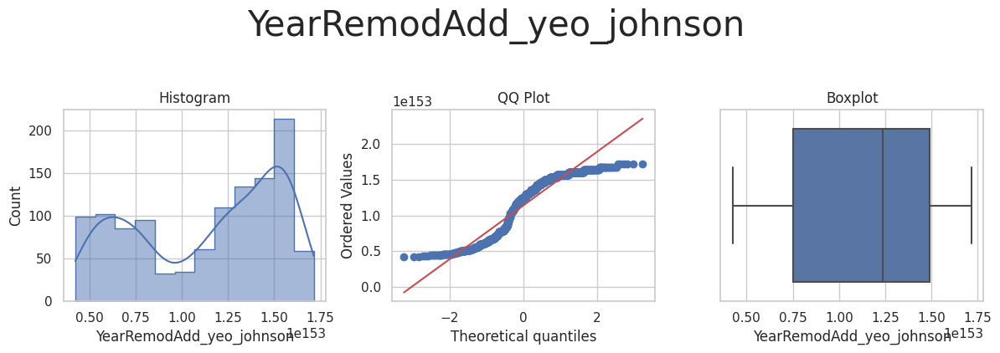



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



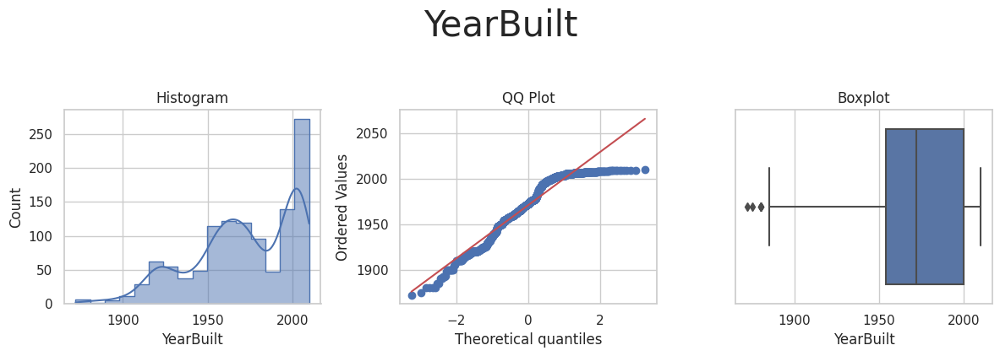

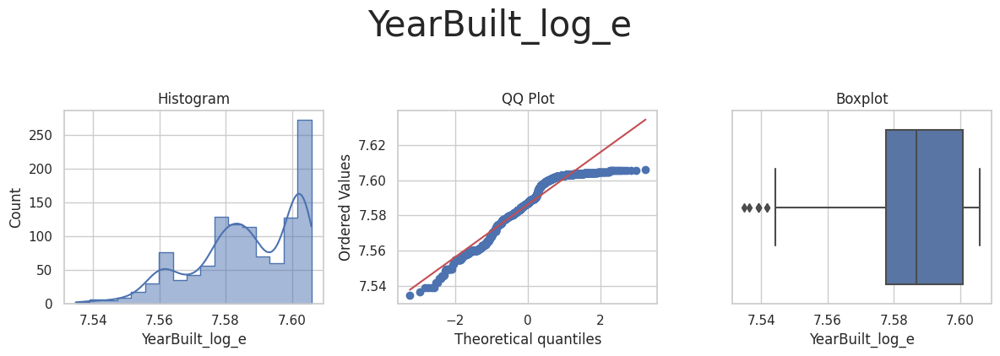

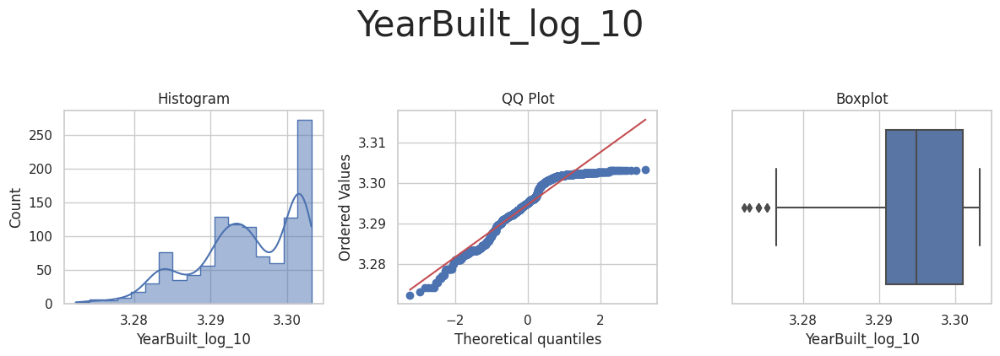

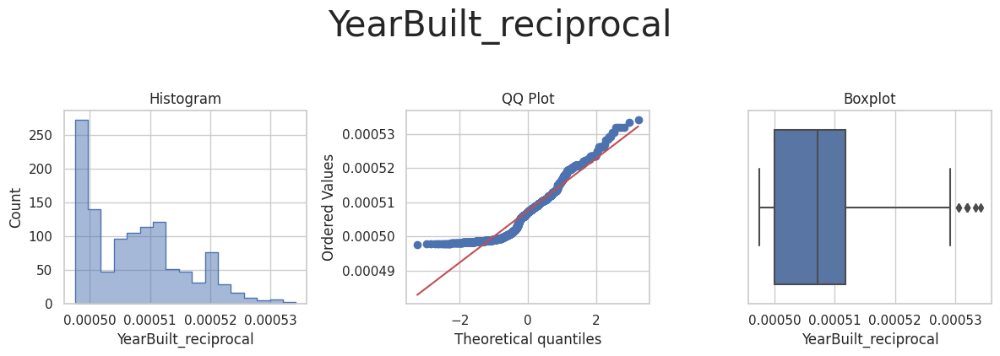

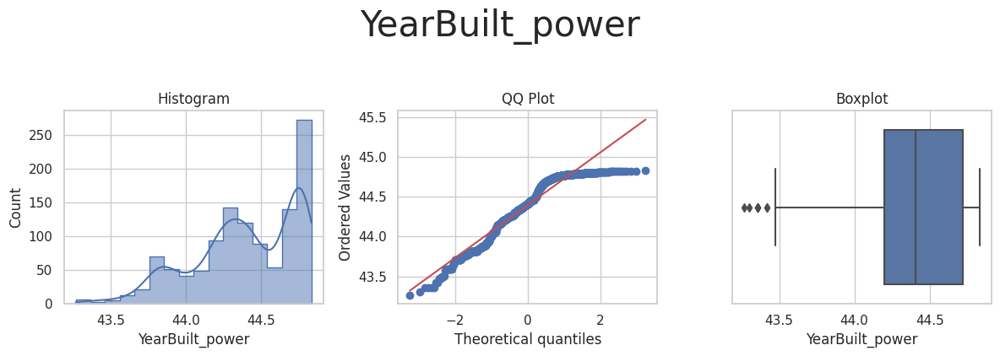

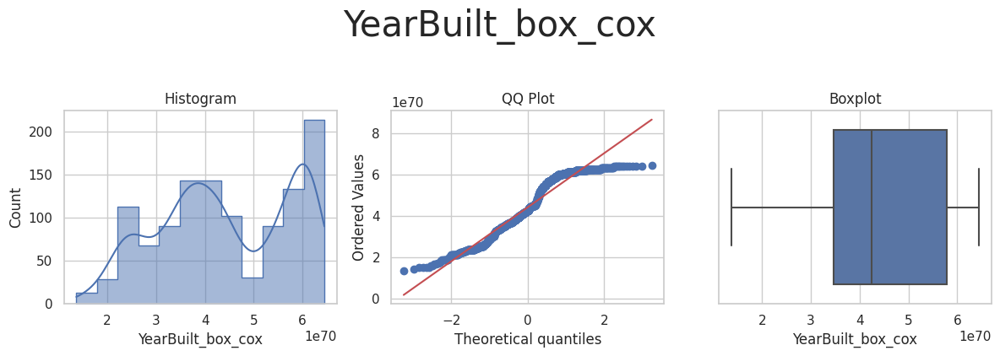

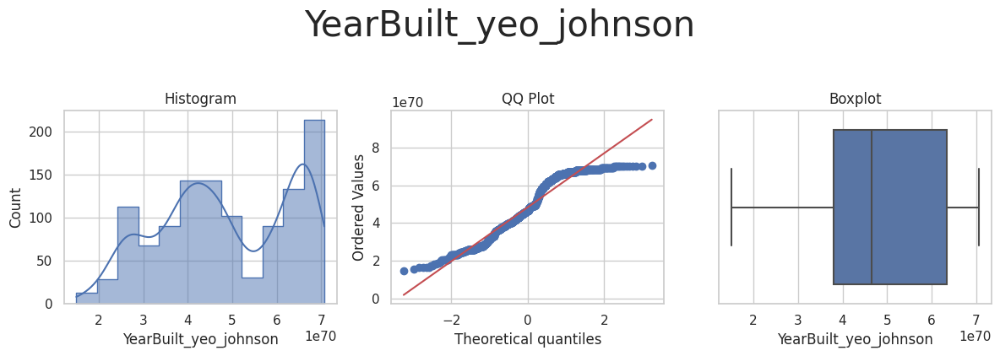

In [42]:
# Numerical transformation
variables_engineering = ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr',
                        'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea',
                        'GarageYrBlt', 'GrLivArea', 'LotArea',
                        'LotFrontage', 'MasVnrArea', 'OpenPorchSF',
                        'TotalBsmtSF', 'YearRemodAdd', 'YearBuilt']
variables_engineering

# Creating a separate DataFrame, with selected variables
df_engineering = TrainSet[variables_engineering].copy()
df_engineering.head(3)

# Creating engineered variabless by applying the transformations, assessing engineered variables distribution and selecting the most suitable method
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='numerical')

There are signs of improved standard distributions and outlier bias for the following features when using:

*Power Transformation:*
    - 1stFlrSF
    - GrLivArea
    - MasVnrArea

*Box Cox Transformation:*
    - BsmtFinSF1
    - BsmtUnfSF
    - GarageArea
    - OpenPorchSF

The remaining variables showed no improvement.

### Applying transformations

#### Power transformations

In [43]:
# Checking original values for features to be transformed
print(TrainSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']].head())
print(TestSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']].head())

     1stFlrSF  GrLivArea  MasVnrArea
618    1828.0     1828.0       452.0
870     894.0      894.0       178.0
92      964.0      964.0       226.0
817    1689.0     1689.0       148.0
302    1541.0     1541.0       150.0
     1stFlrSF  GrLivArea  MasVnrArea
529   2190.25     2515.0       604.0
491    958.00     1578.0       388.0
459    979.00     1203.0       161.0
279   1156.00     2022.0       299.0
655    525.00     1092.0       381.0


In [44]:
from feature_engine.transformation import PowerTransformer

# Creating a copy of TrainSet and TestSet for the transformations
train_set_transformed_p = TrainSet.copy()
test_set_transformed_p = TestSet.copy()

# Initializing the PowerTransformer for selected variables
power_transformer = PowerTransformer(variables=['1stFlrSF', 'GrLivArea', 'MasVnrArea'])

# Fitting the transformer on TrainSet and transform the training set
train_set_transformed_p = power_transformer.fit_transform(train_set_transformed_p)

# Transforming the TestSet using the fitted transformer (no refitting on TestSet)
test_set_transformed_p = power_transformer.transform(test_set_transformed_p)

# Transferring the transformed columns back to the original TrainSet and TestSet
TrainSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']] = train_set_transformed_p[['1stFlrSF', 'GrLivArea', 'MasVnrArea']]
TestSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']] = test_set_transformed_p[['1stFlrSF', 'GrLivArea', 'MasVnrArea']]

# Checking the result to ensure that the original sets have been updated
print(TrainSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']].head())
print(TestSet[['1stFlrSF', 'GrLivArea', 'MasVnrArea']].head())

      1stFlrSF  GrLivArea  MasVnrArea
618  42.755117  42.755117   21.260292
870  29.899833  29.899833   13.341664
92   31.048349  31.048349   15.033296
817  41.097445  41.097445   12.165525
302  39.255573  39.255573   12.247449
      1stFlrSF  GrLivArea  MasVnrArea
529  46.800107  50.149776   24.576411
491  30.951575  39.724048   19.697716
459  31.288976  34.684290   12.688578
279  34.000000  44.966654   17.291616
655  22.912878  33.045423   19.519221


#### Box-Cox transformations

In [45]:
# Checking original values for features to be transformed
print(TrainSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']].head())
print(TestSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']].head())

     BsmtFinSF1  BsmtUnfSF  GarageArea  OpenPorchSF
618        48.0     1680.0       774.0        108.0
870       673.0      894.0       308.0         64.0
92        713.0      163.0       432.0         36.0
817      1218.0      350.0       857.0         59.0
302       719.0     1541.0       843.0         81.0
     BsmtFinSF1  BsmtUnfSF  GarageArea  OpenPorchSF
529      1219.0      816.0       484.0         28.0
491       403.0      238.0       240.0         30.0
459       185.0      524.0       352.0        130.0
279       392.0      768.0       505.0        117.0
655      1557.5      525.0       264.0         36.0


In [46]:
from feature_engine.transformation import BoxCoxTransformer

# Creating a copy of TrainSet and TestSet for safety
train_set_transformed_bc = TrainSet.copy()
test_set_transformed_bc = TestSet.copy()

# Initializing the BoxCoxTransformer for selected variables
box_cox_transformer = BoxCoxTransformer(variables=['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF'])

# Fitting the transformer on TrainSet and transform the training set
train_set_transformed = box_cox_transformer.fit_transform(train_set_transformed_bc)

# Transforming the TestSet using the fitted transformer (no refitting on TestSet)
test_set_transformed = box_cox_transformer.transform(test_set_transformed_bc)

# Transferring the transformed columns back to the original TrainSet and TestSet
TrainSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']] = train_set_transformed[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']]
TestSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']] = test_set_transformed[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']]

# Checking the result to ensure that the original sets have been updated
print(TrainSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']].head())
print(TestSet[['BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'OpenPorchSF']].head())

     BsmtFinSF1  BsmtUnfSF  GarageArea  OpenPorchSF
618   16.034680  41.497403   32.500497     4.638346
870   88.384305  32.101763   21.812211     4.124314
92    91.647538  15.574256   25.292941     3.557833
817  128.152865  21.700281   33.938852     4.044303
302   92.130903  40.074488   33.702341     4.355865
     BsmtFinSF1  BsmtUnfSF  GarageArea  OpenPorchSF
529  128.218578  30.918957   26.570622     3.309988
491   63.976983  18.387085   19.527806     3.378053
459   38.959214  25.727618   23.130710     4.820225
279   62.866662  30.155821   27.062997     4.716884
655  149.405929  25.748146   20.374132     3.557833


In [47]:
# Overview of transformed TrainSet
TrainSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 618 to 684
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   1stFlrSF      1168 non-null   float64
 1   2ndFlrSF      1168 non-null   float64
 2   BedroomAbvGr  1168 non-null   int64  
 3   BsmtExposure  1168 non-null   int64  
 4   BsmtFinSF1    1168 non-null   float64
 5   BsmtFinType1  1168 non-null   int64  
 6   BsmtUnfSF     1168 non-null   float64
 7   GarageArea    1168 non-null   float64
 8   GarageFinish  1168 non-null   int64  
 9   GarageYrBlt   1168 non-null   int64  
 10  GrLivArea     1168 non-null   float64
 11  KitchenQual   1168 non-null   int64  
 12  LotArea       1168 non-null   float64
 13  LotFrontage   1168 non-null   float64
 14  MasVnrArea    1168 non-null   float64
 15  OpenPorchSF   1168 non-null   float64
 16  OverallCond   1168 non-null   int64  
 17  OverallQual   1168 non-null   int64  
 18  TotalBsmtSF   1168 non-null

In [48]:
TrainSet.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
618,42.755117,432.0,0,0,16.034680,0,41.497403,32.500497,0,2007,...,11694.0,90.0,21.260292,4.638346,0,0,1822.0,2007,2007,314813
870,29.899833,764.0,2,1,88.384305,1,32.101763,21.812211,0,1962,...,6600.0,60.0,13.341664,4.124314,0,1,894.0,1962,1962,109500
92,31.048349,809.0,2,1,91.647538,2,15.574256,25.292941,0,1921,...,13360.0,80.0,15.033296,3.557833,1,1,876.0,1921,2006,163500
817,41.097445,1037.0,3,1,128.152865,3,21.700281,33.938852,1,2002,...,13265.0,73.0,12.165525,4.044303,0,2,1568.0,2002,2002,271000
302,39.255573,732.0,3,1,92.130903,1,40.074488,33.702341,1,2001,...,13704.0,110.0,12.247449,4.355865,0,3,1541.0,2001,2002,205000


In [49]:
# Overview of transformed TestSet
TestSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292 entries, 529 to 61
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   1stFlrSF      292 non-null    float64
 1   2ndFlrSF      292 non-null    float64
 2   BedroomAbvGr  292 non-null    int64  
 3   BsmtExposure  292 non-null    int64  
 4   BsmtFinSF1    292 non-null    float64
 5   BsmtFinType1  292 non-null    int64  
 6   BsmtUnfSF     292 non-null    float64
 7   GarageArea    292 non-null    float64
 8   GarageFinish  292 non-null    int64  
 9   GarageYrBlt   292 non-null    int64  
 10  GrLivArea     292 non-null    float64
 11  KitchenQual   292 non-null    int64  
 12  LotArea       292 non-null    float64
 13  LotFrontage   292 non-null    float64
 14  MasVnrArea    292 non-null    float64
 15  OpenPorchSF   292 non-null    float64
 16  OverallCond   292 non-null    int64  
 17  OverallQual   292 non-null    int64  
 18  TotalBsmtSF   292 non-null   

In [50]:
TestSet.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
529,46.800107,716.0,4,1,128.218578,0,30.918957,26.570622,1,1975,...,17695.875,65.0,24.576411,3.309988,4,4,2035.0,1957,1975,200624
491,30.951575,620.0,3,1,63.976983,6,18.387085,19.527806,0,1941,...,9490.000,79.0,19.697716,3.378053,1,4,806.0,1941,1964,133000
459,31.288976,224.0,3,1,38.959214,5,25.727618,23.130710,0,1950,...,7015.000,45.0,12.688578,4.820225,6,1,709.0,1950,2007,110000
279,34.000000,866.0,4,1,62.866662,6,30.155821,27.062997,2,1977,...,10005.000,83.0,17.291616,4.716884,0,3,1160.0,1977,1977,192000
655,22.912878,800.0,3,1,149.405929,1,25.748146,20.374132,0,1971,...,1680.000,30.0,19.519221,3.557833,0,4,525.0,1971,1971,88000


### Smart Correlation

In [51]:
# Carrying out smart scorrelation on the variables
df_engineering = TrainSet.copy()
df_engineering.head(3)


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
618,42.755117,432.0,0,0,16.034680,0,41.497403,32.500497,0,2007,...,11694.0,90.0,21.260292,4.638346,0,0,1822.0,2007,2007,314813
870,29.899833,764.0,2,1,88.384305,1,32.101763,21.812211,0,1962,...,6600.0,60.0,13.341664,4.124314,0,1,894.0,1962,1962,109500
92,31.048349,809.0,2,1,91.647538,2,15.574256,25.292941,0,1921,...,13360.0,80.0,15.033296,3.557833,1,1,876.0,1921,2006,163500


In [52]:
# Creating engineered variables(s) applying the transformation(s)
from feature_engine.selection import SmartCorrelatedSelection
corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.6, selection_method="variance")

corr_sel.fit_transform(df_engineering)
corr_sel.correlated_feature_sets_
corr_sel.features_to_drop_

['1stFlrSF', 'GarageYrBlt', 'YearBuilt']

In [53]:
# Dropping '1stFlrSF', 'GarageYrBlt', 'YearBuilt', 'HasFinBsmt' as identified as highly correlated with other variables
TrainSet.drop(['1stFlrSF', 'GarageYrBlt', 'YearBuilt'], axis=1, inplace=True)
TestSet.drop(['1stFlrSF', 'GarageYrBlt', 'YearBuilt'], axis=1, inplace=True)

TrainSet.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168 entries, 618 to 684
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   2ndFlrSF      1168 non-null   float64
 1   BedroomAbvGr  1168 non-null   int64  
 2   BsmtExposure  1168 non-null   int64  
 3   BsmtFinSF1    1168 non-null   float64
 4   BsmtFinType1  1168 non-null   int64  
 5   BsmtUnfSF     1168 non-null   float64
 6   GarageArea    1168 non-null   float64
 7   GarageFinish  1168 non-null   int64  
 8   GrLivArea     1168 non-null   float64
 9   KitchenQual   1168 non-null   int64  
 10  LotArea       1168 non-null   float64
 11  LotFrontage   1168 non-null   float64
 12  MasVnrArea    1168 non-null   float64
 13  OpenPorchSF   1168 non-null   float64
 14  OverallCond   1168 non-null   int64  
 15  OverallQual   1168 non-null   int64  
 16  TotalBsmtSF   1168 non-null   float64
 17  YearRemodAdd  1168 non-null   int64  
 18  SalePrice     1168 non-null

---

# Saving as new Transformed dataset

In [54]:
# Save as file in cleaned folder
import os
try:
  os.makedirs(name='outputs/datasets/cleaned')
except Exception as e:
  print(e)

[Errno 17] File exists: 'outputs/datasets/cleaned'


In [55]:
# Saving train and test datasets

# Train Set
TrainSet.to_csv("outputs/datasets/cleaned/TrainSetTransformed.csv", index=False)
## Test Set
TestSet.to_csv("outputs/datasets/cleaned/TestSetTransformed.csv", index=False)


---